# United homework on Advanced Regression and Time Series

# Part II : Time Series

## Package imports and definition of functions

In [ ]:
pip install statsmodels==0.12.0

     |████████████████████████████████| 9.5 MB 7.8 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2


In [ ]:
import calendar
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as st
import seaborn as sns


from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error #r2_score, median_absolute_error, 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import TimeSeriesSplit


import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss, acf, pacf


# from IPython.core.interactiveshell import InteractiveShell
# InteractiveShell.ast_node_interactivity = "all"

# import warnings
# warnings.simplefilter(action='ignore')

In [ ]:
### https://ipython.readthedocs.io/en/stable/api/generated/IPython.utils.text.html#classes

pip_list = !pip list
pip_dict = dict(zip(pip_list.fields(0), pip_list.fields(1)))
print(pip_dict['pandas'])

pyth = !python --version

1.1.5


In [ ]:
used_versions = [["python", "['Python 3.7.11']", str(pyth)],  
                 ["matplotlib", "3.2.2", pip_dict['matplotlib']], 
                 ["numpy", "1.19.5", pip_dict['numpy']], 
                 ["pandas", "1.4.1", pip_dict['scipy']],
                 ["scipy", "1.4.1", pip_dict['scipy']],
                 ["seaborn", "0.11.1", pip_dict['seaborn']],
                 ["sklearn", "0.22.2.post1", pip_dict['scikit-learn']],
                 ["statsmodels", "0.12.0", pip_dict['statsmodels']]
                 ]

versions = pd.DataFrame(used_versions)
versions.columns = ["package", "my_versions", 'your_versions']
versions['coincidence'] = ( versions['your_versions'] == versions['my_versions'])
print("The project was written and run within following environment:")
versions

The project was written and run within following environment:


,package,my_versions,your_versions,coincidence
0,python,['Python 3.7.11'],['Python 3.7.11'],True
1,matplotlib,3.2.2,3.2.2,True
2,numpy,1.19.5,1.19.5,True
3,pandas,1.4.1,1.4.1,True
4,scipy,1.4.1,1.4.1,True
5,seaborn,0.11.1,0.11.1,True
6,sklearn,0.22.2.post1,0.22.2.post1,True
7,statsmodels,0.12.0,0.12.0,True


In [ ]:
# RANDOM_STATE = 31415926

### Plotting

plt.rcParams["figure.figsize"] = (15, 8)

# sns.set(style='whitegrid', palette="bright")
sns.set_theme()
sns.set(font_scale = 1.25)

FONT_SIZE=14

# plt.style.use('seaborn')

In [ ]:
# TEST_DAYS = 61
TEST_DAYS = 31

### Utils

In [ ]:
### utils for EDA


def corr_matrix_plot(df, corr_type, low_lim=0.8, 
                     figsize=(20, 10), shrink=0.6, fontsize=10):
    """
    - calculate correlation matrix (Pearson's or Spearman's)
    - plot full heatmap of correlation matrix
    - plot heatmap of correlation matrix only coefficients with absolute value more than the low limit
    
    Requirements:
        matplotlib.pyplot as plt
        nupmy as np
        pandas as pd
        seaborn as sns
    
    :param df:          [pandas.DataFrame]  dataset
    :param corr_type:   [str]               name of correlation type ('pearson' or 'spearman')
    :param low_lim:     [float]             low limit for absolute value of correlation coefficients 
                                                to check high correlation
    :param high_lim:    [float]             high limit for absolute value of correlation coefficients 
                                                to check low correlation
    :param shrink:      [float]             parameter for adjusting the size of colorbar
    
    Returns:
    - correlation matrix [pandas.DataFrame]
    """
    
    corr_matrix = df.corr(corr_type)

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=np.bool))

    fig, ax = plt.subplots(1, 2, figsize=figsize)

    # Generate a custom diverging colormap
#     cmap = sns.diverging_palette(240, 10, as_cmap=True)
    cmap = sns.diverging_palette(150, 275, s=80, l=55, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio

    plt.subplot(1, 2, 1)
    sns.heatmap(corr_matrix, mask=mask, center=0, cmap=cmap, 
                annot=True, annot_kws={'fontsize' : fontsize}, fmt='.2f', 
                square=True, linewidths=0.1, linecolor='k', 
                cbar=True, cbar_kws={"shrink": shrink, "ticks": list(np.round(np.arange(-1, 1.2, 0.2), 1)) }, 
                vmin=-1, vmax=1)
    plt.xticks(rotation=90)
    plt.title(corr_type.title()+"'s' correlation matrix: $C_{ij}$", fontsize=FONT_SIZE)

    plt.subplot(1, 2, 2)
    sns.heatmap(corr_matrix[abs(corr_matrix) > low_lim], mask=mask, center=0, cmap=cmap, 
                annot=True, annot_kws={'fontsize' : fontsize}, fmt='.2f', 
                square=True, linewidths=0.1, linecolor='k', 
                cbar=True, cbar_kws={"shrink": shrink, "ticks": list(np.round(np.arange(-1, 1.2, 0.2), 1)) }, 
                vmin=-1, vmax=1)    
    
    plt.xticks(rotation=90)
    plt.title(corr_type.title() +"'s' correlation matrix $C_{ij}$: $|C_{ij}|>$"+str(low_lim), fontsize=FONT_SIZE)    
    plt.grid(linestyle=':', color='k')
    plt.show()
    
    return corr_matrix



def period_decomposition(x, period=None, two_sided=False, 
                         visualize=False, window=None,
                         legend_loc='upper right', the_title=None,
                         x_label=None, y_label=None, 
                         figsize=(20, 18)):
    """
    - perform trend-seasonal-residuals decomposition using statsmodels.tsa.seasonal.seasonal_decompose
    - plot trend, seasonal, and residuals
    
    Requirements:
        import matplotlib.pyplot as plt
        import pandas as pd
        from statsmodels.tsa.seasonal import seasonal_decompose
    
    Returns:
        trend
        seasonal
        residuals
    """
    
    decomposed = seasonal_decompose(x, two_sided=two_sided, period=period)
    t = decomposed.trend
    s = decomposed.seasonal
    r = decomposed.resid
    
    t1 = t.dropna()
    s1 = s.loc[t1.index]
    r1 = r.loc[t1.index]
    
    def window_shift(x, wndw):
        if wndw == None:
            return(len(x))
        else:
            return wndw



    if visualize:
        plt.subplots(3, 1, figsize=figsize)
        
        plt.subplot(3, 1, 1)
        plt.plot(t, '-', color='black', 
                 label=f"trend : range={(t.max()-t.min()):.4g}")
        plt.legend(loc=legend_loc)
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.grid(linestyle=':', color='k')
        plt.title(the_title)
        
        plt.subplot(3, 1, 2)
        plt.plot(s[-window_shift(s, window):], '-', color='darkgreen', 
                 label=f"periodic : range={(s.max()-s.min()):.4g}")
        plt.legend(loc=legend_loc)
        plt.xlabel(x_label)
        plt.ylabel(y_label) 
        plt.grid(linestyle=':', color='k')
        
        plt.subplot(3, 1, 3)
        plt.plot(r[-window_shift(r, window):], '-', color='darkorange', 
                 label=f"residuals : sigma={r.std():.4g}")
        plt.legend(loc=legend_loc)
        plt.xlabel(x_label)
        plt.ylabel(y_label)        
        
        plt.grid(linestyle=':', color='k')
        plt.show()    
    
    return t, s, r

In [ ]:
### utils for analysis of results



def plot_coefficients(model, X_train):
    """
        Plots sorted coefficient values of the model
        
        Requirements:
            pandas as pd
    """
    coefs = pd.DataFrame(model.coef_, index=X_train.columns, columns=['coef'])
    coefs['abs'] = coefs['coef'].apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=True)
    # coefs['coef'].plot(kind='bar')
    coefs['coef'].plot.barh(color='navy')
    plt.title("Coefficient estimates")
    plt.grid(linestyle=':', color='k')
    plt.show()
    
    coefs = coefs.sort_values(by="abs", ascending=False)
    display(coefs['coef'])



def plot_prediction(df_train, df_test, true_col, prediction_col, 
                    figsize=(20, 8), enlrgd_since='2012-12-01', title='', loc='best'):
    plt.figure(figsize=figsize)
    plt.plot(df_train[true_col], label='Train', color = 'royalblue')
    plt.plot(df_test[true_col], label='Test', color = 'navy')
    plt.plot(df_train[prediction_col], label='Prediction Train', color = 'red', alpha=0.5)
    plt.plot(df_test[prediction_col], label='Prediction Test',  color = 'maroon', alpha=0.5)
    plt.legend(loc=loc)
    plt.title(title)
    plt.grid(linestyle=':', color='k')

    plt.figure(figsize=figsize);
    plt.plot(df_test.loc[enlrgd_since:, true_col], '-', color='navy', 
            label="true data")
    plt.plot(df_test.loc[enlrgd_since:, prediction_col], '-', color='maroon', 
            label="predictions")
    plt.legend()
    plt.title(title + '\nLast month')
    plt.grid(linestyle=':', color='k')

    plt.show()



def smoothing_stats(x, y, window=19):
        
    x_min = x.min()
    x_max = x.max()
    
    x_s = []
    means = []
    stds = []
    for k , xk in enumerate(x):
        if (xk >= x_min+window/2) & (xk <= x_max-window/2):
            x_s.append(xk)            
            x_window = x[x.between(xk-window/2, xk+window/2)]
            means.append(y[x_window.index].mean())
            stds.append(y[x_window.index].std())
    
    return x_s, means, stds
    
    
    
def residual_plots(y_true, y_pred, smooth_window=20, nlags=14*24):

    residuals = y_pred - y_true

    print(f"We have {len(residuals)} points.")
    y_min = residuals.min()
    y_max = residuals.max()
    y_range = y_max - y_min

    smooth_stats = pd.DataFrame(smoothing_stats(y_true, residuals, window=smooth_window)).T
    smooth_stats.columns = ['x', 'smooth_means', 'smooth_stds']
    smooth_stats = smooth_stats.sort_values('x')

    plt.subplots(1, 3, figsize=(21, 7))

    plt.subplot(1, 3, 1)
    plt.fill_between( smooth_stats['x'], 
                    (smooth_stats['smooth_means'] - 2*smooth_stats['smooth_stds']),
                    (smooth_stats['smooth_means'] + 2*smooth_stats['smooth_stds']), 
                    color=np.array([251, 223, 223])/255, 
                    label="$\mu_{smooth}\pm 2\sigma_{smooth}$")
    sns.scatterplot(y_true, residuals, color='navy')
    plt.plot(smooth_stats['x'], smooth_stats['smooth_means'], 
            '-', color='maroon', lw=3, label="$\mu_{smooth}$")
    plt.plot(smooth_stats['x'], smooth_stats['smooth_means'] + 2*smooth_stats['smooth_stds'], 
            '-', color='maroon')
    plt.plot(smooth_stats['x'], smooth_stats['smooth_means'] - 2*smooth_stats['smooth_stds'], 
            '-', color='maroon')
    plt.ylim(y_min-0.02*y_range, y_max+0.02*y_range)
    plt.legend()
    plt.title("scatterplot of residuals") 
    plt.grid(linestyle=':', color='k')


    x_fit = np.linspace(y_min, y_max, 201)
    loc_laplace, scale_laplace = st.laplace.fit(residuals)
    loc_norm, scale_norm = st.norm.fit(residuals)
    # print(f"Fitting of residuals by Laplace distribution: fitted mean = {loc:.3f}, fitted std = {scale:.3f}")
    y_fit_laplace = st.laplace.pdf(x_fit, loc_laplace, scale_laplace)
    y_fit_norm = st.norm.pdf(x_fit, loc_norm, scale_norm)


    plt.subplot(1, 3, 2)
    sns.distplot(residuals, bins=100, vertical=True, 
                color='navy', label=f"distribution of residuals")
    plt.plot(y_fit_laplace, x_fit, '-r', 
            label=f"approximation by Laplace distribution:\n  fitted mean = {loc_laplace:.3g}, fitted std = {scale_laplace:.3g}")
    plt.plot(y_fit_norm, x_fit, '-g', 
            label=f"approximation by normal distribution:\n  fitted mean = {loc_norm:.3g}, fitted std = {scale_norm:.3g}")
    plt.legend()
    plt.ylim(y_min-0.02*y_range, y_max+0.02*y_range)
    plt.title("distribution of residuals") 
    plt.grid(linestyle=':', color='k')


    acf_residuals = acf(residuals, nlags=nlags, missing='conservative')

    plt.subplot(1, 3, 3)
    plt.plot(acf_residuals, '-ko', color='navy') 
    plt.plot([0, len(acf_residuals)], [0, 0], '-b')
    plt.title('Autocorrelation function')
    plt.grid(linestyle=':', color='k')

plt.show()

## EDA

### Read data

In [ ]:
# Choose the location: 'colab' or 'local'
location = 'colab'

if location == 'colab':
    from google.colab import drive
    drive.mount('/content/drive')
    FILE_PATH = "/content/drive/MyDrive/Colab Notebooks/DS_EPAM Basic course"
elif location == 'local':
    FILE_PATH = "./DS_EPAM_basic_course"
else:
    print("Please choose the location: 'colab' or 'local'.")

Mounted at /content/drive


In [ ]:
data = pd.read_csv(FILE_PATH + "/hour.csv")

In [ ]:
time_work_start = time.time()

In [ ]:
data.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


### Timemarks

Let us create new index as a timemark...

In [ ]:
data.index = data["dteday"] + '-' + data["hr"].astype(str)
data.index = pd.to_datetime(data.index, format='%Y-%m-%d-%H')

and immediately check timemarks for monotonocity and equidistancy.

In [ ]:
print("- Are our timemarks monotonic?")
print(f"- {data.index.is_monotonic_increasing}.")
print()


print("- Are our timemarks equidistant?")
time_diff_counts = pd.Series(data.index).diff().value_counts()
if len(time_diff_counts) > 1:
    print("- No. The time steps are:\n")
    display(time_diff_counts)
else:
    print(f"- Yes. The time step is {time_diff_counts.values[0]}.")

- Are our timemarks monotonic?
- True.

- Are our timemarks equidistant?
- No. The time steps are:



0 days 01:00:00    17303
0 days 02:00:00       64
0 days 03:00:00        6
0 days 07:00:00        1
0 days 14:00:00        1
0 days 23:00:00        1
0 days 13:00:00        1
1 days 13:00:00        1
dtype: int64

### Target

In [ ]:
(data['casual'] + data['registered'] == data['cnt']).value_counts()

True    17379
dtype: int64

In [ ]:
data_full = data.copy()

data.drop(['dteday', 'instant', 'casual', 'registered'], inplace=True, axis=1)
print(f"We have {len(data)} points from {data.index.min()} till {data.index.max()}.")
data.head()

We have 17379 points from 2011-01-01 00:00:00 till 2012-12-31 23:00:00.


,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
2011-01-01 00:00:00,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,16
2011-01-01 01:00:00,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,40
2011-01-01 02:00:00,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,32
2011-01-01 03:00:00,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,13
2011-01-01 04:00:00,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,1


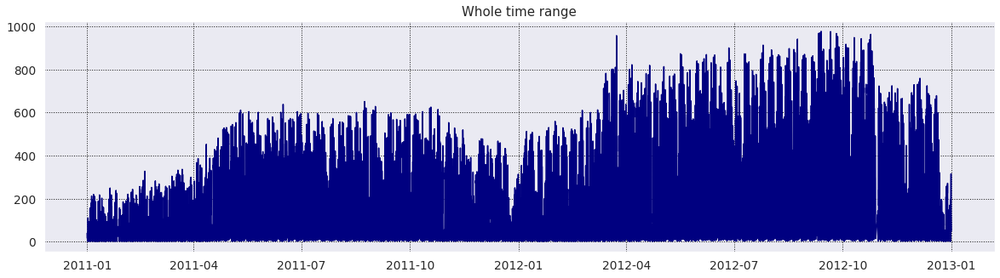

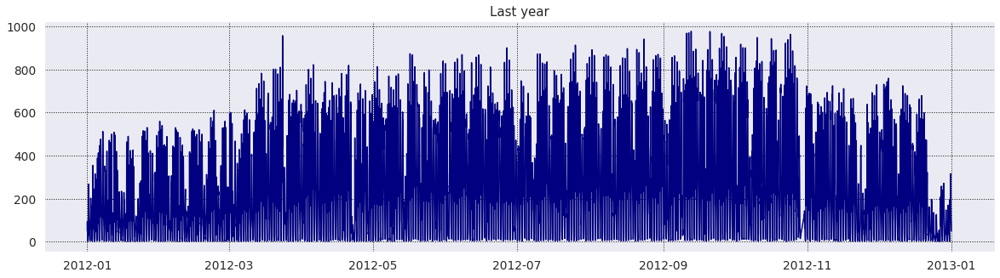

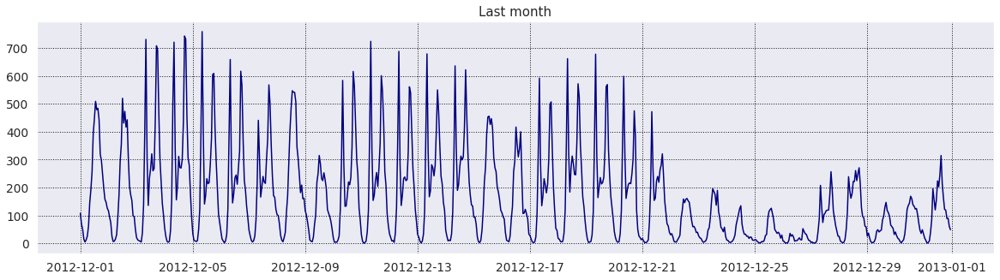

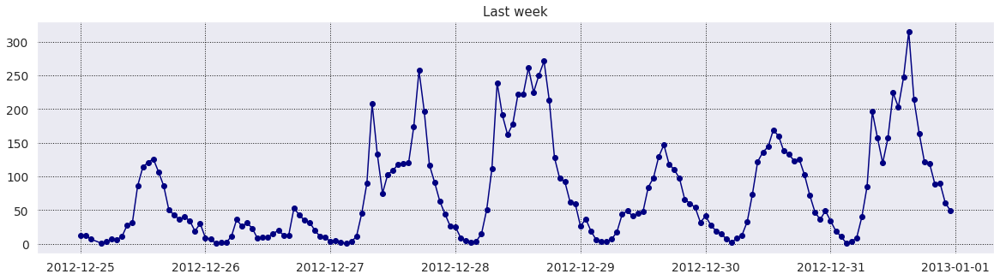

In [ ]:
plt.figure(figsize=(20, 5))
plt.plot(data['cnt'], color='navy')
plt.title('Whole time range')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5))
plt.plot(data.loc['2012-01-01':, 'cnt'], color='navy')
plt.title('Last year')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5))
plt.plot(data.loc['2012-12-01':, 'cnt'], color='navy')
plt.title('Last month')
plt.grid(linestyle=':', color='k')
plt.show()

plt.figure(figsize=(20, 5));
plt.plot(data.loc['2012-12-25':, 'cnt'], '-o', color='navy')
plt.title('Last week')
plt.grid(linestyle=':', color='k')
plt.show()

We have seasonal components with day- and week-p periodicities in the target.

In [ ]:
data['cnt'].describe()

count    17379.000000
mean       189.463088
std        181.387599
min          1.000000
25%         40.000000
50%        142.000000
75%        281.000000
max        977.000000
Name: cnt, dtype: float64

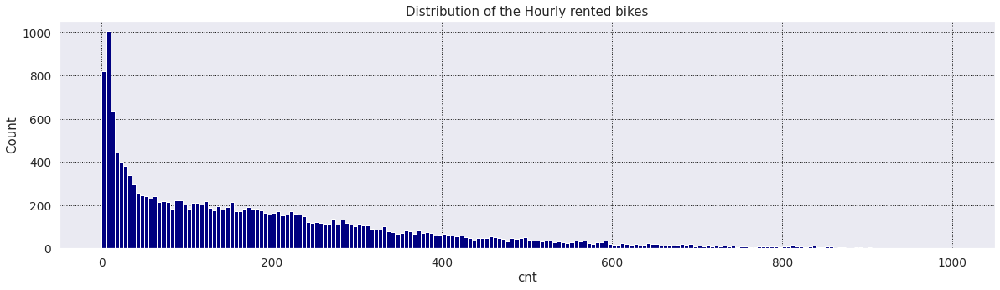

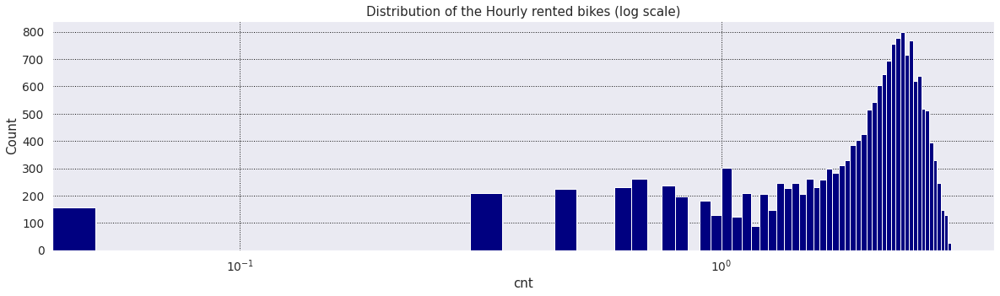

In [ ]:
# Draw histogram
plt.figure(figsize=(20, 5))
data['cnt'].hist(color='navy', bins=np.linspace(0, 1000, 201))
plt.title('Distribution of the Hourly rented bikes')
plt.ylabel('Count')
plt.xlabel('cnt')
plt.grid(linestyle=':', color='k')
plt.show()


# Draw log-histogram
plt.figure(figsize=(20, 5))
data['cnt'].apply(np.log10).hist(color='navy', bins=np.linspace(0, 3, 61))
plt.semilogx(1, 1)
plt.title('Distribution of the Hourly rented bikes (log scale)')
plt.ylabel('Count')
plt.xlabel('cnt')
plt.grid(linestyle=':', color='k')
plt.show()

The distribution of target has a long (almost exponential) tail. Maybe it will better to use logarithm of `cnt` as a target in modelling and predicting processes.

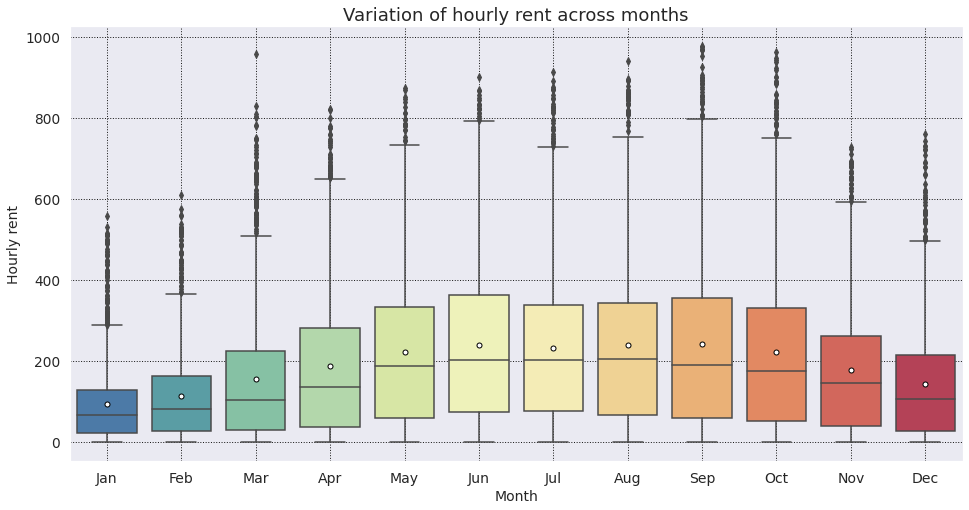

In [ ]:
# Distribution of data by months

plt.subplots(1, 1, figsize=(16, 8))
sns.boxplot(data=data, x=data.index.month, y='cnt', 
            palette="Spectral_r", showmeans=True, 
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"5"})
plt.ylabel(ylabel='Hourly rent', size=14)
plt.xlabel(xlabel='Month', size=14)
plt.xticks(np.arange(12), 
           ['Jan', 'Feb', 'Mar', 
            'Apr', 'May', 'Jun', 
            'Jul', 'Aug', 'Sep', 
            'Oct', 'Nov', 'Dec'],  
           size=14)
plt.title('Variation of hourly rent across months', fontsize=18)
plt.grid(linestyle=':', color='k')
plt.show()

Here I just create a dict for mapping months as numbers to the abbreviations of their names.

In [ ]:
month_map_dict = {month: index for index, month in enumerate(calendar.month_abbr) if month}
month_map_dict = dict(zip(month_map_dict.values(), month_map_dict.keys()))
month_map_dict

{1: 'Jan',
 2: 'Feb',
 3: 'Mar',
 4: 'Apr',
 5: 'May',
 6: 'Jun',
 7: 'Jul',
 8: 'Aug',
 9: 'Sep',
 10: 'Oct',
 11: 'Nov',
 12: 'Dec'}

In [ ]:
month_describe = data.groupby(data.index.month).describe()['cnt'].drop('count', axis=1)
month_describe.index = month_describe.index.map(month_map_dict)

month_describe.style.background_gradient(cmap=sns.color_palette("YlOrBr", as_cmap=True))

,mean,std,min,25%,50%,75%,max
Jan,94.424773,99.907146,1.000000,21.000000,66.000000,128.000000,559.000000
Feb,112.865026,112.486565,1.000000,28.000000,82.000000,164.000000,610.000000
Mar,155.410726,163.543050,1.000000,30.000000,104.000000,224.000000,957.000000
Apr,187.260960,181.137902,1.000000,36.000000,136.000000,282.000000,822.000000
May,222.907258,187.721497,1.000000,59.000000,188.500000,332.250000,873.000000
Jun,240.515278,196.038950,1.000000,73.750000,203.000000,362.000000,900.000000
Jul,231.819892,187.483806,1.000000,77.500000,202.000000,338.250000,913.000000
Aug,238.097627,200.444648,1.000000,65.500000,204.000000,343.000000,941.000000
Sep,240.773138,214.609531,1.000000,60.000000,190.000000,355.000000,977.000000
Oct,222.158511,203.477057,1.000000,52.000000,174.000000,331.500000,963.000000


We observe obvious noticeable dependence of target on month - rent of bikes more popular on summer than on winter.

And here I just create a dict for mapping day of weeks as numbers to the abbreviations of their names.

In [ ]:
dayweek_map_dict = {dayweek: index for index, dayweek in enumerate(calendar.day_abbr) if dayweek}
dayweek_map_dict = dict(zip(dayweek_map_dict.values(), dayweek_map_dict.keys()))
dayweek_map_dict

{0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}

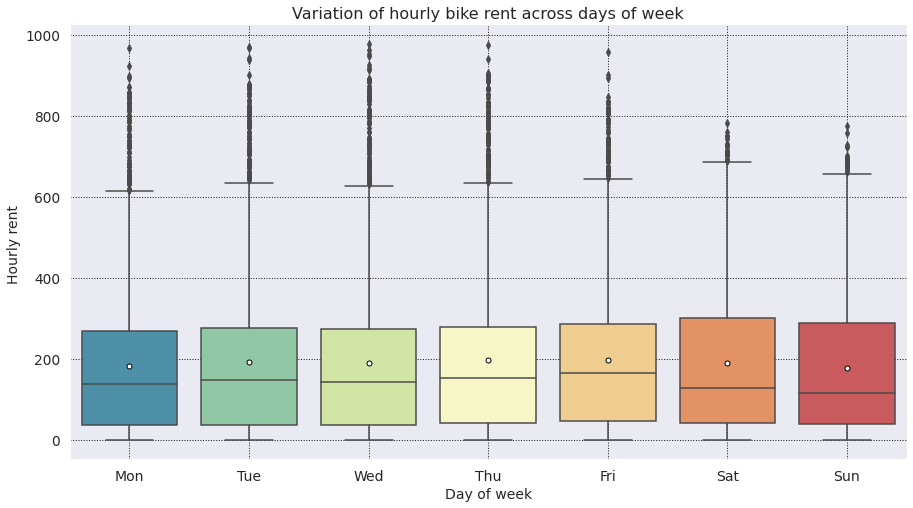

In [ ]:
# Distribution of data by days of the week

plt.subplots(1, 1, figsize=(15, 8))
sns.boxplot(data=data, x=data.index.dayofweek, y='cnt', 
            palette = "Spectral_r", showmeans=True, 
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"5"});
plt.ylabel(ylabel='Hourly rent ', size=14)
plt.xlabel(xlabel='Day of week', size=14)
plt.xticks(np.arange(7), dayweek_map_dict.values(), fontsize=14)
plt.grid(linestyle=':')
plt.title('Variation of hourly bike rent across days of week', fontsize=16)
plt.grid(linestyle=':', color='k')
plt.show()

In [ ]:
dayofweek_describe = data.groupby(data.index.dayofweek).describe()['cnt'].drop('count', axis=1)
dayofweek_describe.index = dayofweek_describe.index.map(dayweek_map_dict)

dayofweek_describe.style.background_gradient(cmap=sns.color_palette("YlOrBr", as_cmap=True))

,mean,std,min,25%,50%,75%,max
Mon,183.744655,179.514167,1.000000,37.000000,139.000000,268.000000,968.000000
Tue,191.238891,187.820480,1.000000,36.000000,147.000000,276.000000,970.000000
Wed,191.130505,190.894464,1.000000,36.000000,143.000000,274.500000,977.000000
Thu,196.436665,188.011923,1.000000,42.000000,154.000000,280.000000,976.000000
Fri,196.135907,174.076894,1.000000,47.500000,165.000000,286.500000,957.000000
Sat,190.209793,179.820569,1.000000,42.000000,129.000000,300.000000,783.000000
Sun,177.468825,168.167710,1.000000,40.000000,116.000000,288.000000,776.000000


Maybe the mean values of bike rent are slightly decreased on Sunday and Monday. But with such high values of standard deviation no one can claim it for sure.

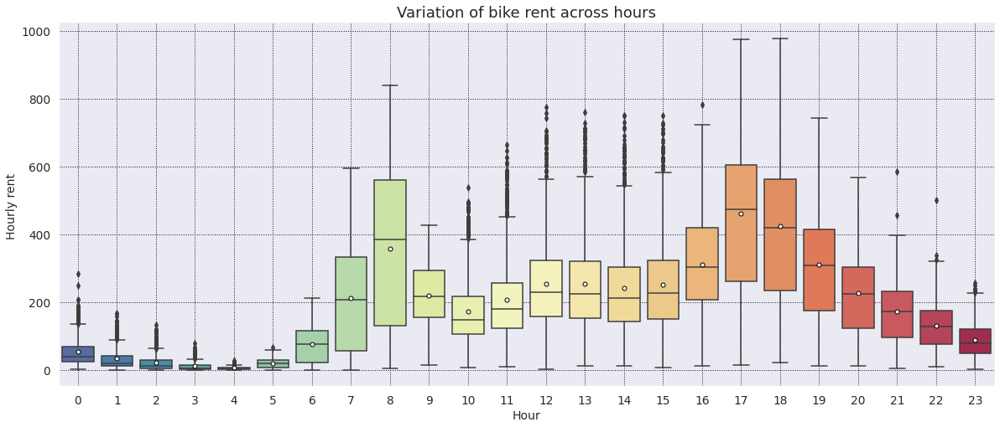

In [ ]:
# Distribution of data by days of the week

plt.subplots(1, 1, figsize=(20, 8))
sns.boxplot(data=data, x=data.index.hour, y='cnt',
            palette = "Spectral_r", showmeans=True, 
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"5"});
plt.ylabel(ylabel='Hourly rent ', size=14)
plt.xlabel(xlabel='Hour', size=14) 
plt.title('Variation of bike rent across hours', size=18)
plt.grid(linestyle=':', color='k')
plt.show()

In [ ]:
hour_describe = data.groupby(data.index.hour).describe()['cnt'].drop('count', axis=1)
hour_describe.style.background_gradient(cmap=sns.color_palette("YlOrBr", as_cmap=True))

,mean,std,min,25%,50%,75%,max
0,53.898072,42.307910,2.000000,25.000000,40.000000,69.000000,283.000000
1,33.375691,33.538727,1.000000,11.000000,20.000000,42.250000,168.000000
2,22.869930,26.578642,1.000000,5.000000,11.000000,28.500000,132.000000
3,11.727403,13.239190,1.000000,3.000000,6.000000,15.000000,79.000000
4,6.352941,4.143818,1.000000,3.000000,6.000000,8.000000,28.000000
5,19.889819,13.200765,1.000000,8.000000,19.000000,29.000000,66.000000
6,76.044138,55.084348,1.000000,23.000000,76.000000,117.000000,213.000000
7,212.064649,161.441936,1.000000,55.500000,208.000000,332.000000,596.000000
8,359.011004,235.189285,5.000000,131.500000,385.000000,559.500000,839.000000
9,219.309491,93.703458,14.000000,155.000000,216.000000,293.000000,426.000000


Two peaks related to daily rush hours (about 8 AM and 5-6 PM) are observed clearly. We should try to reproduce them during modelling.

### Multivarite EDA

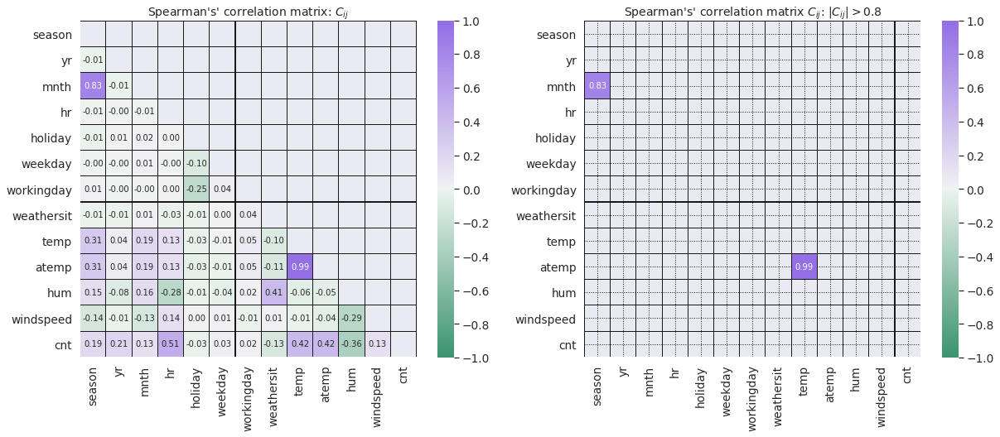

In [ ]:
corr_matrix = corr_matrix_plot(data, 'spearman', low_lim=0.8, shrink=0.75)

There are two correlating pairs: `mnth` (month) - `season` and `temp` and `atemp`. Let take a look at these pairs.

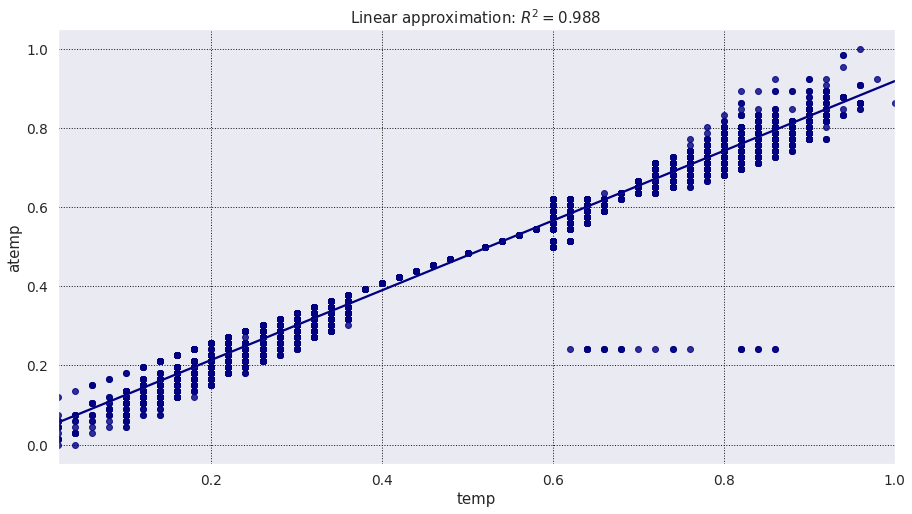

In [ ]:
# plt.subplots(1, 1, figsize=(15, 8))
sns.regplot(x='temp', y='atemp', data=data, color='navy')
plt.title(f"Linear approximation: $R^2=${data[['temp', 'atemp']].corr().values[0, 1]:.3f}")
plt.grid(linestyle=':', color='k')
plt.show()

In [ ]:
mask = (data['temp'] > 0.6) & (data['atemp'] < 0.4)

print(f"We have {len(data[mask])} outliers lying far from linar dependence (`temp` > 0.6 and `atemp` < 0.4).")

We have 24 outliers lying far from linar dependence (`temp` > 0.6 and `atemp` < 0.4).


The dependence of `atemp` on `temp` is very close to linear. Taking in mind positions of outliers and the sence of `atemp` as "feeling temperature" while `temp` represnt the real temperature I will drop the `atemp` column from the dataframe.

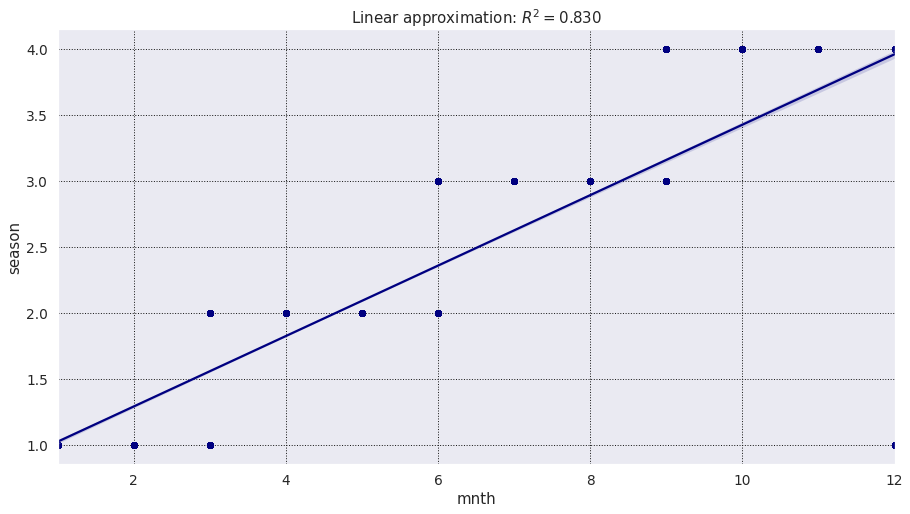

In [ ]:
plt.subplots(1, 1, figsize=(15, 8))
sns.regplot(x='mnth', y='season', data=data, color='navy')
plt.title(f"Linear approximation: $R^2=${data[['mnth', 'season']].corr().values[0, 1]:.3f}")
plt.grid(linestyle=':', color='k')
plt.show()

Though the linear approximation doesn't suits well to the `mnth`-`season` pair we can claims that we have the deterministic step-like dependence for this pair of variables. Since `mnth` provides more detailed information than `season` which can be treated as aggregate function for `mnth`, I will drop `season` from the dataframe.

In [ ]:
data.drop(['atemp', 'season'], axis=1, inplace=True)
data.head()

,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
2011-01-01 00:00:00,0,1,0,0,6,0,1,0.24,0.81,0.0,16
2011-01-01 01:00:00,0,1,1,0,6,0,1,0.22,0.80,0.0,40
2011-01-01 02:00:00,0,1,2,0,6,0,1,0.22,0.80,0.0,32
2011-01-01 03:00:00,0,1,3,0,6,0,1,0.24,0.75,0.0,13
2011-01-01 04:00:00,0,1,4,0,6,0,1,0.24,0.75,0.0,1


## Linear Regression with simplest time features as baseline

In [ ]:
data.head()

,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
2011-01-01 00:00:00,0,1,0,0,6,0,1,0.24,0.81,0.0,16
2011-01-01 01:00:00,0,1,1,0,6,0,1,0.22,0.80,0.0,40
2011-01-01 02:00:00,0,1,2,0,6,0,1,0.22,0.80,0.0,32
2011-01-01 03:00:00,0,1,3,0,6,0,1,0.24,0.75,0.0,13
2011-01-01 04:00:00,0,1,4,0,6,0,1,0.24,0.75,0.0,1


Let us keep only time-based features.

In [ ]:
data = data.drop(['weathersit', 'temp', 'hum', 'windspeed'], axis=1)
data.head()

,yr,mnth,hr,holiday,weekday,workingday,cnt
2011-01-01 00:00:00,0,1,0,0,6,0,16
2011-01-01 01:00:00,0,1,1,0,6,0,40
2011-01-01 02:00:00,0,1,2,0,6,0,32
2011-01-01 03:00:00,0,1,3,0,6,0,13
2011-01-01 04:00:00,0,1,4,0,6,0,1


Let us split our dataset into the train and test ones, extracting last month for testing.

In [ ]:
df0 = data.copy()

indx_test = df0.index > (df0.index.max() - pd.Timedelta(days=TEST_DAYS))
#1.5 years train, 6 months test

df0_test = df0.loc[indx_test].copy(deep=True)
df0_train = df0.loc[~indx_test].copy(deep=True)

print(f"We have {len(df0_train)} points ({len(df0_train)/len(df0):.1%}) for training.")
print(f"We have {len(df0_test)} points ({len(df0_test)/len(df0):.1%}) for testing.")

y_train = df0_train.dropna()['cnt']
X_train = df0_train.dropna().drop(['cnt'], axis=1)
y_test = df0_test.dropna()['cnt']
X_test = df0_test.dropna().drop(['cnt'], axis=1)

print()
print(f"train : from {X_train.index[0]} till {X_train.index[-1]} .")
print(f"test  : from {X_test.index[0]} till {X_test.index[-1]} .")

We have 16637 points (95.7%) for training.
We have 742 points (4.3%) for testing.

train : from 2011-01-01 00:00:00 till 2012-11-30 23:00:00 .
test  : from 2012-12-01 00:00:00 till 2012-12-31 23:00:00 .


In [ ]:
t0 = time.time()

pipe = Pipeline([('scaler', MinMaxScaler()), 
                 ('lin_reg', LinearRegression())])
cv_ts = TimeSeriesSplit(n_splits=5)
cross_val_score(pipe, X_train, y_train, cv=cv_ts, 
                scoring='neg_mean_absolute_error')

pipe.fit(X_train, y_train);
model = pipe.named_steps['lin_reg']

t_train = time.time() - t0

df0_train['prediction_lm'] = pipe.predict(X_train)
df0_train['prediction_lm'] = np.where(df0_train['prediction_lm']>0, 
                                      df0_train['prediction_lm'].astype(int), 0)
df0_test['prediction_lm'] = pipe.predict(X_test)
df0_test['prediction_lm'] = np.where(df0_test['prediction_lm']>0, 
                                     df0_test['prediction_lm'].astype(int), 0)

MAE = mean_absolute_error(y_true=df0_test['cnt'],
                          y_pred=df0_test['prediction_lm'])

results_df = pd.DataFrame(["LinReg_simplest", MAE, t_train]).T
results_df.columns = ["Model", "MAE", "train_time_sec"]
results_df

,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158


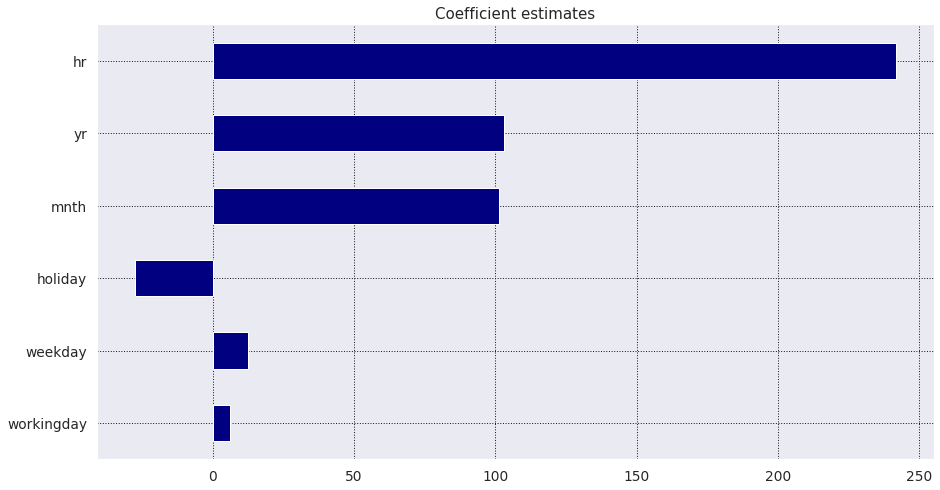

hr            241.651460
yr            103.181390
mnth          101.255122
holiday       -27.532957
weekday        12.356442
workingday      6.243876
Name: coef, dtype: float64

In [ ]:
plot_coefficients(model, X_train)

The most important features are date and time, while the importance of 'categorical' (holiday, weekday and working day) is less.

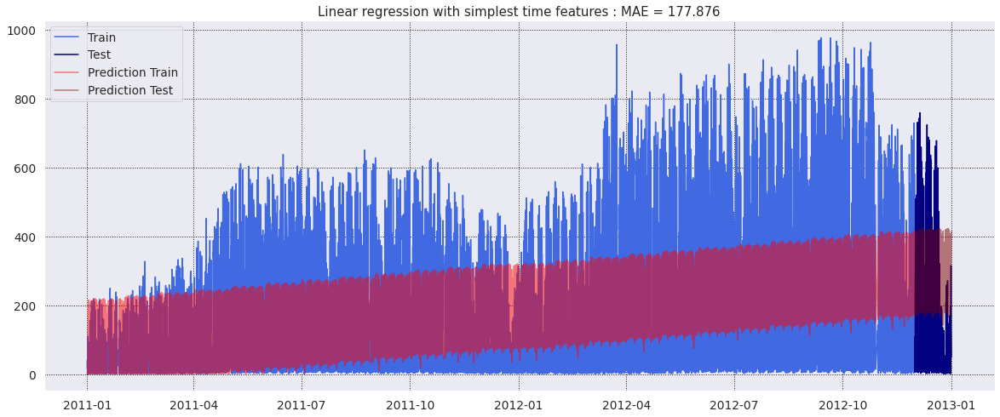

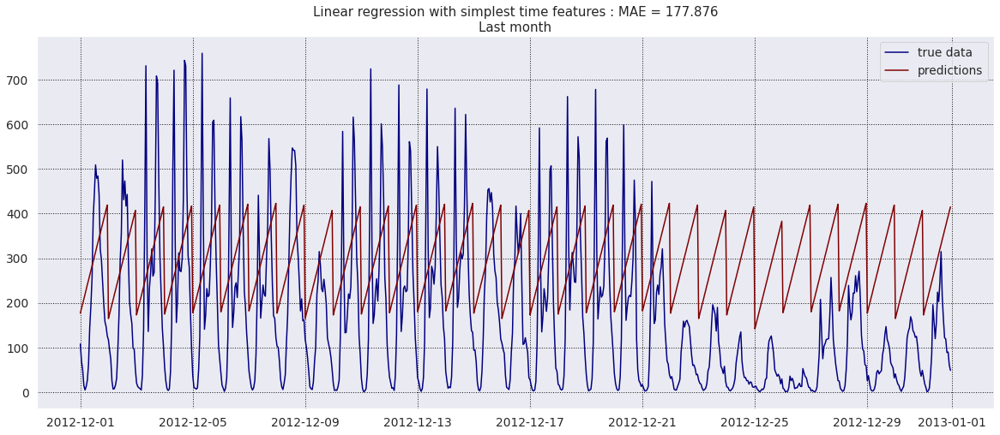

In [ ]:
plot_prediction(df0_train, df0_test, 'cnt', 'prediction_lm', 
                enlrgd_since='2012-10-01', 
                title=f"Linear regression with simplest time features : MAE = {MAE:.3f}")

* Model only caught trend well.
* We have linear dependence of target within thea day, which is obvious for linear model with hor as a variable. It can be improved by introducing a set of Fourier components.

We have 742 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

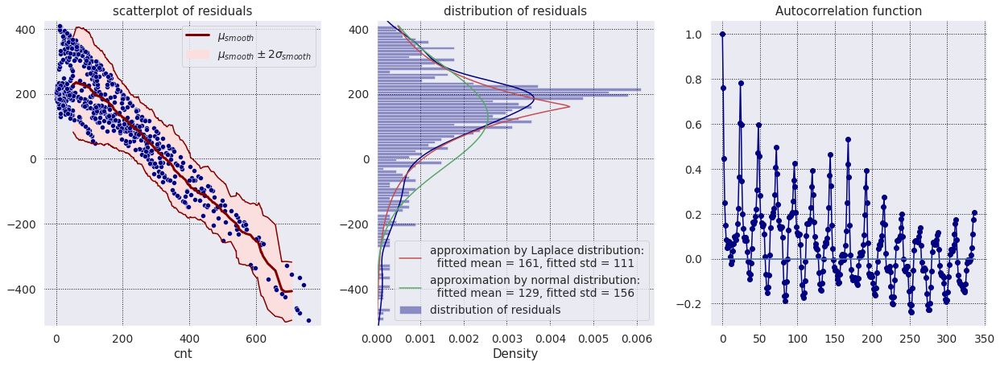

In [ ]:
residual_plots(df0_test['cnt'], df0_test['prediction_lm'], smooth_window=100)

We have a strong bias and that means that we should change/improve our model.

TODO

- [ ] Intoduce Fourier compoments into the baseline model.

## Linear Regression with Fourier components as (Fourier) extended baseline

Let us add sine and cosine Fourier components with periods from 2 till 24 hours to catch properly the behaviour of target function within one day period. We omit n=1 since it is a constant for our quantization of time.

Strictly speaking we should also add Fourier components with larger periods to properly depict the behaviour of target function within whole week period. But we will make it at the next step (if we will have enough time). Now our aim is to show that introduction of Fourier harmonics will allow our model perform better.

In [ ]:
df0

,yr,mnth,hr,holiday,weekday,workingday,cnt
2011-01-01 00:00:00,0,1,0,0,6,0,16
2011-01-01 01:00:00,0,1,1,0,6,0,40
2011-01-01 02:00:00,0,1,2,0,6,0,32
2011-01-01 03:00:00,0,1,3,0,6,0,13
2011-01-01 04:00:00,0,1,4,0,6,0,1
...,...,...,...,...,...,...,...
2012-12-31 19:00:00,1,12,19,0,1,1,119
2012-12-31 20:00:00,1,12,20,0,1,1,89
2012-12-31 21:00:00,1,12,21,0,1,1,90
2012-12-31 22:00:00,1,12,22,0,1,1,61


### 24 "hour"  Fourier components

In [ ]:
t = (df0.index.values - df0.index.values[0] )/ (df0.index.values[1] - df0.index.values[0])

for n in range(2, 25):
    ### T = n hours
    df0[f'fourier_sin_{n}'] = np.sin(2*np.pi*t/n)
    df0[f'fourier_cos_{n}'] = np.cos(2*np.pi*t/n)

df0.head(25)

,yr,mnth,hr,holiday,weekday,workingday,cnt,fourier_sin_2,fourier_cos_2,fourier_sin_3,fourier_cos_3,fourier_sin_4,fourier_cos_4,fourier_sin_5,fourier_cos_5,fourier_sin_6,fourier_cos_6,fourier_sin_7,fourier_cos_7,fourier_sin_8,fourier_cos_8,fourier_sin_9,fourier_cos_9,fourier_sin_10,fourier_cos_10,fourier_sin_11,fourier_cos_11,fourier_sin_12,fourier_cos_12,fourier_sin_13,fourier_cos_13,fourier_sin_14,fourier_cos_14,fourier_sin_15,fourier_cos_15,fourier_sin_16,fourier_cos_16,fourier_sin_17,fourier_cos_17,fourier_sin_18,fourier_cos_18,fourier_sin_19,fourier_cos_19,fourier_sin_20,fourier_cos_20,fourier_sin_21,fourier_cos_21,fourier_sin_22,fourier_cos_22,fourier_sin_23,fourier_cos_23,fourier_sin_24,fourier_cos_24
2011-01-01 00:00:00,0,1,0,0,6,0,16,0.000000e+00,1.0,0.000000e+00,1.0,0.000000e+00,1.000000e+00,0.000000e+00,1.000000,0.000000e+00,1.0,0.000000e+00,1.000000,0.000000e+00,1.000000e+00,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000e+00,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000e+00,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000e+00,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000,0.000000e+00,1.000000e+00
2011-01-01 01:00:00,0,1,1,0,6,0,40,1.224647e-16,-1.0,8.660254e-01,-0.5,1.000000e+00,6.123234e-17,9.510565e-01,0.309017,8.660254e-01,0.5,7.818315e-01,0.623490,7.071068e-01,7.071068e-01,6.427876e-01,0.766044,5.877853e-01,0.809017,5.406408e-01,0.841254,5.000000e-01,8.660254e-01,4.647232e-01,0.885456,4.338837e-01,0.900969,4.067366e-01,0.913545,3.826834e-01,9.238795e-01,3.612417e-01,0.932472,3.420201e-01,0.939693,3.246995e-01,0.945817,3.090170e-01,9.510565e-01,2.947552e-01,0.955573,2.817326e-01,0.959493,2.697968e-01,0.962917,2.588190e-01,9.659258e-01
2011-01-01 02:00:00,0,1,2,0,6,0,32,-2.449294e-16,1.0,-8.660254e-01,-0.5,1.224647e-16,-1.000000e+00,5.877853e-01,-0.809017,8.660254e-01,-0.5,9.749279e-01,-0.222521,1.000000e+00,6.123234e-17,9.848078e-01,0.173648,9.510565e-01,0.309017,9.096320e-01,0.415415,8.660254e-01,5.000000e-01,8.229839e-01,0.568065,7.818315e-01,0.623490,7.431448e-01,0.669131,7.071068e-01,7.071068e-01,6.736956e-01,0.739009,6.427876e-01,0.766044,6.142127e-01,0.789141,5.877853e-01,8.090170e-01,5.633201e-01,0.826239,5.406408e-01,0.841254,5.195840e-01,0.854419,5.000000e-01,8.660254e-01
2011-01-01 03:00:00,0,1,3,0,6,0,13,3.673940e-16,-1.0,-2.449294e-16,1.0,-1.000000e+00,-1.836970e-16,-5.877853e-01,-0.809017,1.224647e-16,-1.0,4.338837e-01,-0.900969,7.071068e-01,-7.071068e-01,8.660254e-01,-0.500000,9.510565e-01,-0.309017,9.898214e-01,-0.142315,1.000000e+00,6.123234e-17,9.927089e-01,0.120537,9.749279e-01,0.222521,9.510565e-01,0.309017,9.238795e-01,3.826834e-01,8.951633e-01,0.445738,8.660254e-01,0.500000,8.371665e-01,0.546948,8.090170e-01,5.877853e-01,7.818315e-01,0.623490,7.557496e-01,0.654861,7.308360e-01,0.682553,7.071068e-01,7.071068e-01
2011-01-01 04:00:00,0,1,4,0,6,0,1,-4.898587e-16,1.0,8.660254e-01,-0.5,-2.449294e-16,1.000000e+00,-9.510565e-01,0.309017,-8.660254e-01,-0.5,-4.338837e-01,-0.900969,1.224647e-16,-1.000000e+00,3.420201e-01,-0.939693,5.877853e-01,-0.809017,7.557496e-01,-0.654861,8.660254e-01,-5.000000e-01,9.350162e-01,-0.354605,9.749279e-01,-0.222521,9.945219e-01,-0.104528,1.000000e+00,6.123234e-17,9.957342e-01,0.092268,9.848078e-01,0.173648,9.694003e-01,0.245485,9.510565e-01,3.090170e-01,9.308737e-01,0.365341,9.096320e-01,0.415415,8.878852e-01,0.460065,8.660254e-01,5.000000e-01
2011-01-01 05:00:00,0,1,5,0,6,0,1,6.123234e-16,-1.0,-8.660254e-01,-0.5,1.000000e+00,3.061617e-16,-2.449294e-16,1.000000,-8.660254e-01,0.5,-9.749279e-01,-0.222521,-7.071068e-01,-7.071068e-01,-3.420201e-01,-0.939693,1.224647e-16,-1.000000,2.817326e-01,-0.959493,5.000000e-01,-8.660254e-01,6.631227e-01,-0.748511,7.818315e-01,-0.623490,8.660254e-01,-0.500000,9.238795e-01,-3.826834e-01,9.618256e-01,-0.273663,9.848078e-01,-0.173648,9.965845e-01,-0.082579,1.000000e+00,6.123234e-17,9.972038e-01,0.0747

In [ ]:
indx_test = df0.index > (df0.index.max() - pd.Timedelta(days=TEST_DAYS))
#1.5 years train, 6 months test

df0_test = df0.loc[indx_test].copy(deep=True)
df0_train = df0.loc[~indx_test].copy(deep=True)

print(f"We have {len(df0_train)} points ({len(df0_train)/len(df0):.1%}) for training.")
print(f"We have {len(df0_test)} points ({len(df0_test)/len(df0):.1%}) for testing.")

y_train = df0_train.dropna()['cnt']
X_train = df0_train.dropna().drop(['cnt'], axis=1)
y_test = df0_test.dropna()['cnt']
X_test = df0_test.dropna().drop(['cnt'], axis=1)

print()
print(f"train : from {X_train.index[0]} till {X_train.index[-1]} .")
print(f"test  : from {X_test.index[0]} till {X_test.index[-1]} .")

We have 16637 points (95.7%) for training.
We have 742 points (4.3%) for testing.

train : from 2011-01-01 00:00:00 till 2012-11-30 23:00:00 .
test  : from 2012-12-01 00:00:00 till 2012-12-31 23:00:00 .


In [ ]:
t0 = time.time()

pipe = Pipeline([('scaler', MinMaxScaler()), 
                 ('lin_reg', LinearRegression())])
cv_ts = TimeSeriesSplit(n_splits=5)
cross_val_score(pipe, X_train, y_train, cv=cv_ts, 
                scoring='neg_mean_absolute_error')

pipe.fit(X_train, y_train);
model = pipe.named_steps['lin_reg']

t_train = time.time() - t0

df0_train['prediction_lm_fourier_hour'] = pipe.predict(X_train)
df0_train['prediction_lm_fourier_hour'] = np.where(df0_train['prediction_lm_fourier_hour']>0, 
                                                   df0_train['prediction_lm_fourier_hour'].astype(int), 0)
df0_test['prediction_lm_fourier_hour'] = pipe.predict(X_test)
df0_test['prediction_lm_fourier_hour'] = np.where(df0_test['prediction_lm_fourier_hour']>0, 
                                                  df0_test['prediction_lm_fourier_hour'].astype(int), 0)

MAE = mean_absolute_error(y_true=df0_test['cnt'],
                          y_pred=df0_test['prediction_lm_fourier_hour'])

loc_last = len(results_df)
results_df.loc[loc_last, 'Model'] = "LinReg_fourier_hour"
results_df.loc[loc_last, 'MAE'] =  MAE
results_df.loc[loc_last, 'train_time_sec'] =  t_train
results_df

,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348


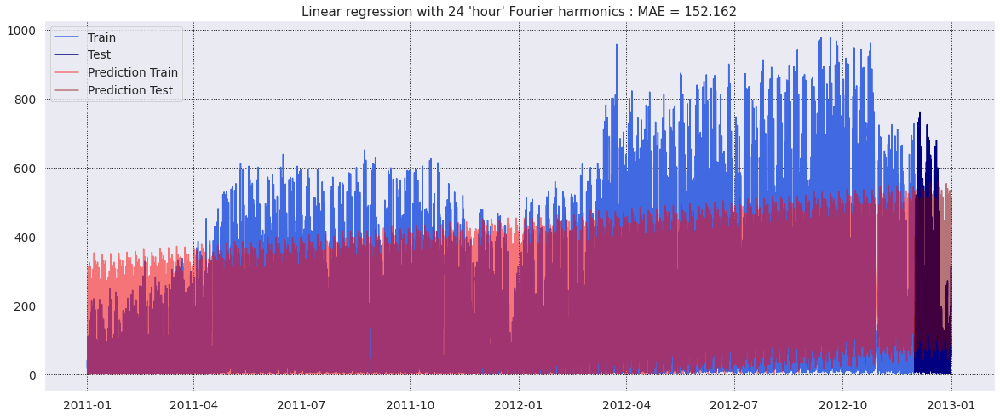

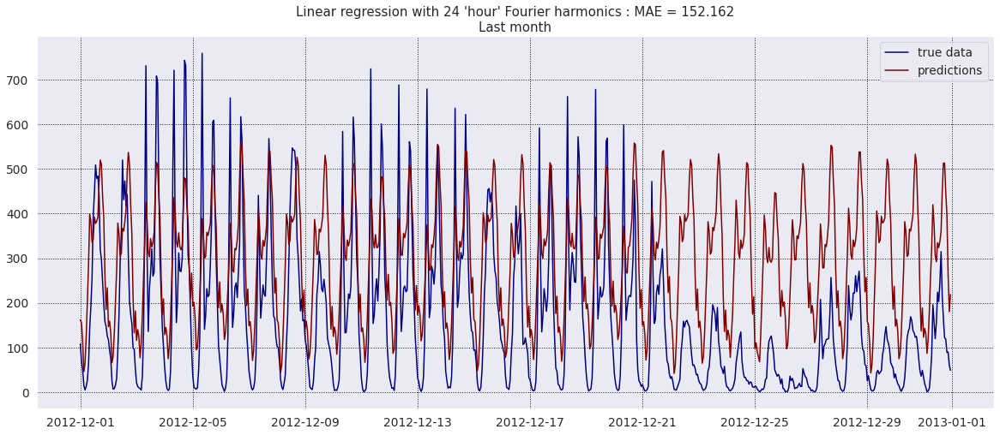

In [ ]:
plot_prediction(df0_train, df0_test, 'cnt', 'prediction_lm_fourier_hour', 
                enlrgd_since='2012-10-01', 
                title=f"Linear regression with 24 'hour' Fourier harmonics : MAE = {MAE:.3f}")

We have 742 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

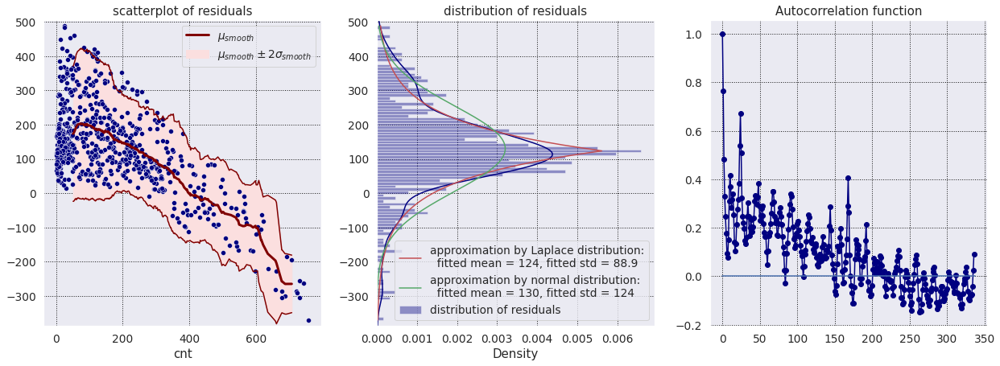

In [ ]:
residual_plots(df0_test['cnt'], df0_test['prediction_lm_fourier_hour'], smooth_window=100)

As one can see the introduction of 24 Fourier harmonics have made baseline model better. But we still have a strong bias in residual errors.

Autocorrelation function shows us that these errors can not be depicted as white noise and still have day- and week - periodic components despite the fact that we try to predict these components introducing day-periodic components.

### Another 6 "day" Fourier components

Let us add 6 harmonics with period in from 2 up to 7 days to catch the week-periodicity.

In [ ]:
df0

### first 24 harmonics have been already created in dataframe.

for n in range(2, 8):
    ### T = n hours
    df0[f'fourier_sin_{24*n}'] = np.sin(2*np.pi*t/(n*24))
    df0[f'fourier_cos_{24*n}'] = np.cos(2*np.pi*t/(n*24))

df0.columns

Index(['yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday', 'cnt',
       'fourier_sin_2', 'fourier_cos_2', 'fourier_sin_3', 'fourier_cos_3',
       'fourier_sin_4', 'fourier_cos_4', 'fourier_sin_5', 'fourier_cos_5',
       'fourier_sin_6', 'fourier_cos_6', 'fourier_sin_7', 'fourier_cos_7',
       'fourier_sin_8', 'fourier_cos_8', 'fourier_sin_9', 'fourier_cos_9',
       'fourier_sin_10', 'fourier_cos_10', 'fourier_sin_11', 'fourier_cos_11',
       'fourier_sin_12', 'fourier_cos_12', 'fourier_sin_13', 'fourier_cos_13',
       'fourier_sin_14', 'fourier_cos_14', 'fourier_sin_15', 'fourier_cos_15',
       'fourier_sin_16', 'fourier_cos_16', 'fourier_sin_17', 'fourier_cos_17',
       'fourier_sin_18', 'fourier_cos_18', 'fourier_sin_19', 'fourier_cos_19',
       'fourier_sin_20', 'fourier_cos_20', 'fourier_sin_21', 'fourier_cos_21',
       'fourier_sin_22', 'fourier_cos_22', 'fourier_sin_23', 'fourier_cos_23',
       'fourier_sin_24', 'fourier_cos_24', 'fourier_sin_48', 'fourier_cos_48'

We should exclude `prediction_lm`, `prediction_lm_fourier_24` from our variables.

In [ ]:
indx_test = df0.index > (df0.index.max() - pd.Timedelta(days=TEST_DAYS))
#1.5 years train, 6 months test

df0_test = df0.loc[indx_test].copy(deep=True)
df0_train = df0.loc[~indx_test].copy(deep=True)

print(f"We have {len(df0_train)} points ({len(df0_train)/len(df0):.1%}) for training.")
print(f"We have {len(df0_test)} points ({len(df0_test)/len(df0):.1%}) for testing.")

y_train = df0_train.dropna()['cnt']
X_train = df0_train.dropna().drop(['cnt'], axis=1)
y_test = df0_test.dropna()['cnt']
X_test = df0_test.dropna().drop(['cnt'], axis=1)

print()
print(f"train : from {X_train.index[0]} till {X_train.index[-1]} .")
print(f"test  : from {X_test.index[0]} till {X_test.index[-1]} .")

We have 16637 points (95.7%) for training.
We have 742 points (4.3%) for testing.

train : from 2011-01-01 00:00:00 till 2012-11-30 23:00:00 .
test  : from 2012-12-01 00:00:00 till 2012-12-31 23:00:00 .


In [ ]:
t0 = time.time()

pipe = Pipeline([('scaler', MinMaxScaler()), 
                 ('lin_reg', LinearRegression())])
cv_ts = TimeSeriesSplit(n_splits=5)
cross_val_score(pipe, X_train, y_train, cv=cv_ts, 
                scoring='neg_mean_absolute_error')

pipe.fit(X_train, y_train);
model = pipe.named_steps['lin_reg']

t_train = time.time() - t0

df0_train['prediction_lm_fourier_week'] = pipe.predict(X_train)
df0_train['prediction_lm_fourier_week'] = np.where(df0_train['prediction_lm_fourier_week']>0, 
                                              df0_train['prediction_lm_fourier_week'].astype(int), 
                                              0)
df0_test['prediction_lm_fourier_week'] = pipe.predict(X_test)
df0_test['prediction_lm_fourier_week'] = np.where(df0_test['prediction_lm_fourier_week']>0, 
                                             df0_test['prediction_lm_fourier_week'].astype(int), 
                                             0)

MAE = mean_absolute_error(y_true=df0_test['cnt'],
                          y_pred=df0_test['prediction_lm_fourier_week'])

loc_last = len(results_df)
results_df.loc[loc_last, 'Model'] = "LinReg_fourier_week"
results_df.loc[loc_last, 'MAE'] =  MAE
results_df.loc[loc_last, 'train_time_sec'] =  t_train
results_df

,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941


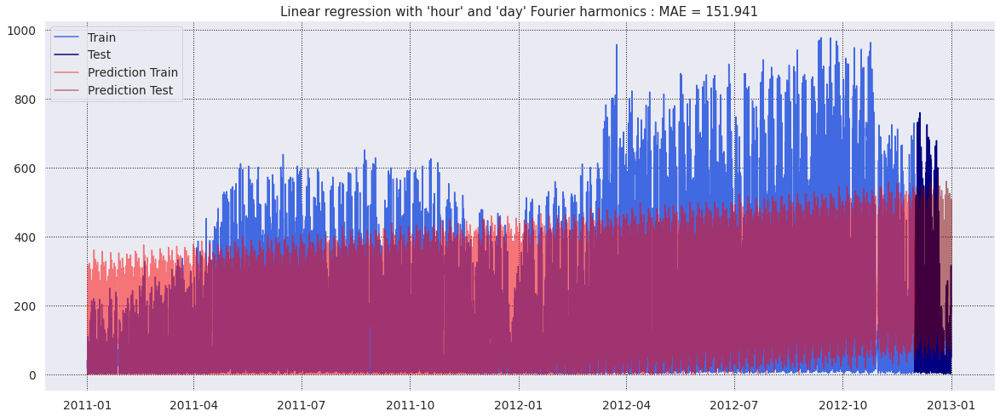

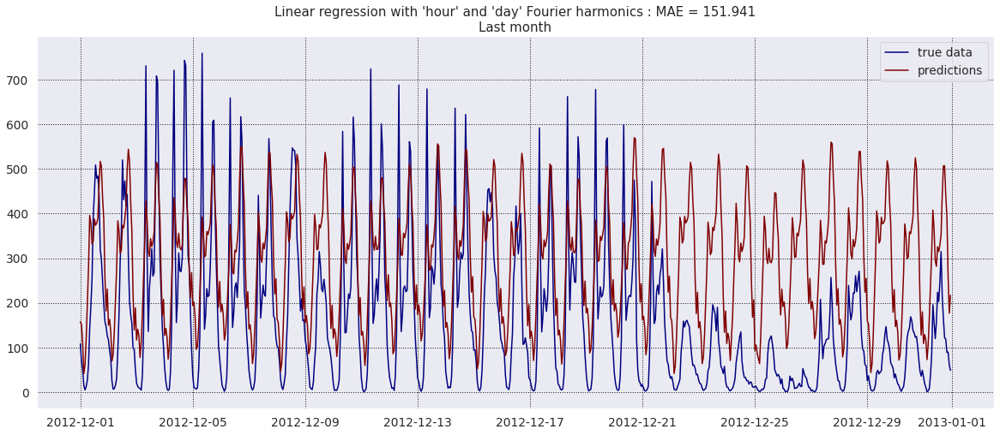

In [ ]:
plot_prediction(df0_train, df0_test, 'cnt', 'prediction_lm_fourier_week', 
                enlrgd_since='2012-10-01', 
                title=f"Linear regression with 'hour' and 'day' Fourier harmonics : MAE = {MAE:.3f}")

We have 742 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

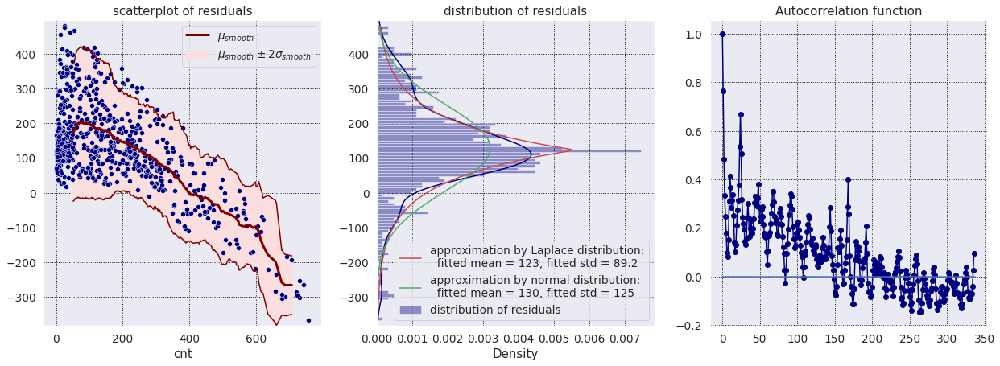

In [ ]:
residual_plots(df0_test['cnt'], df0_test['prediction_lm_fourier_week'], smooth_window=100)

The errors shows us that we still have strong bias in our model. Due to this fact we cannot extract any useful informatin from the distribution of error.
Autocorrelation function shows us that these errors can not be depicted as white noise and still have day- and week - periodic components despite the fact that we try to predict these components introducing corresponding components.

Autocorrelation function shows us that these errors can not be depicted as white noise and still have day- and week - periodic components despite the fact that we try to predict these components introducing corresponding components.

Introduction of additional "day" Fourier harmonics allows us to improve our results a little. As one can see from plot of predictions as a time-dependent function now we catch the behaviour of target better during the week. The pretty slight increasing in MAE is cause, in my opinion, by the last "Pre-Christmas" and "Christmas" weeks where rent decreased and predicting of incresing bike rent for working days leads to error for this particular week, and as result, to the positive addition to the MAE, though other weeks play for decreasing of MAE. In other words, to observe the effect of 'day' harmonics introduction we should take a test dataset for 2 or 3 months.

Nevertheless, we can mak a common conclusion, that an introduction of Fourier harmonics as a rule leads to the improvement of model performance.



## Time Series EDA and Feature Engineering

### Imputation of missing values

In [ ]:
df1 = data['cnt'].copy()

### Using `resample` allows us to higlight missing data
df1 = df1.resample('1h').mean()
df1.head(100)

print(f"We have {len(df1[df1.isna()])} nans amongst {len(df1)} points.")


df1_ffill = df1.fillna(method = 'ffill')
df1_bfill = df1.fillna(method = 'bfill')

df1[df1.isna()] = ( df1_ffill[df1.isna()] + df1_bfill[df1.isna()] )/2
print(f"We have {len(df1[df1.isna()])} nans amongst {len(df1)} points after filling nans.")

df1 = pd.DataFrame(df1)
df1['cnt'] = df1['cnt'].astype(int)

print()
print("Now time steps are:")
pd.Series(df1.index).diff().value_counts()

We have 165 nans amongst 17544 points.
We have 0 nans amongst 17544 points after filling nans.

Now time steps are:


0 days 01:00:00    17543
dtype: int64

### Test for stationarity

Let us check the time dependence of target for stationarity using two tests - Augmented Dickey–Fuller (ADF) test and Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test. The information about them with details can be found here:

* ADF - https://en.wikipedia.org/wiki/Augmented_Dickey%E2%80%93Fuller_test
* KPSS - https://en.wikipedia.org/wiki/KPSS_test

In [ ]:
alpha = 0.05
print(f"alpha = {alpha}\n")
# ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(df1['cnt'], autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
if result[1] < alpha:
  print("The process is stationary.\n")
else:
  print("The process is non-stationary.\n")  

alpha = 0.05

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -6.949021627134662
p-value: 9.801556051473314e-10
The process is stationary.



In [ ]:
print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):')
# kpss test
kpsstest = kpss(df1['cnt'], regression='c')
print("KPSS Statistic = " + str(kpsstest[0]))
print( "p-value = " +str(kpsstest[1]))
if kpsstest[1] < alpha:
  print("The process is non-stationary.\n")
else:
  print("The process is stationary.\n")

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):
KPSS Statistic = 18.073311332848967
p-value = 0.01
The process is non-stationary.



/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1843: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)


These test provided us with controversial answers, But since one of them claims that process is non-stationary it will be better to consider the process as non-stationary one.

### Time Series Decomposition

#### *Simplest Decomposition*

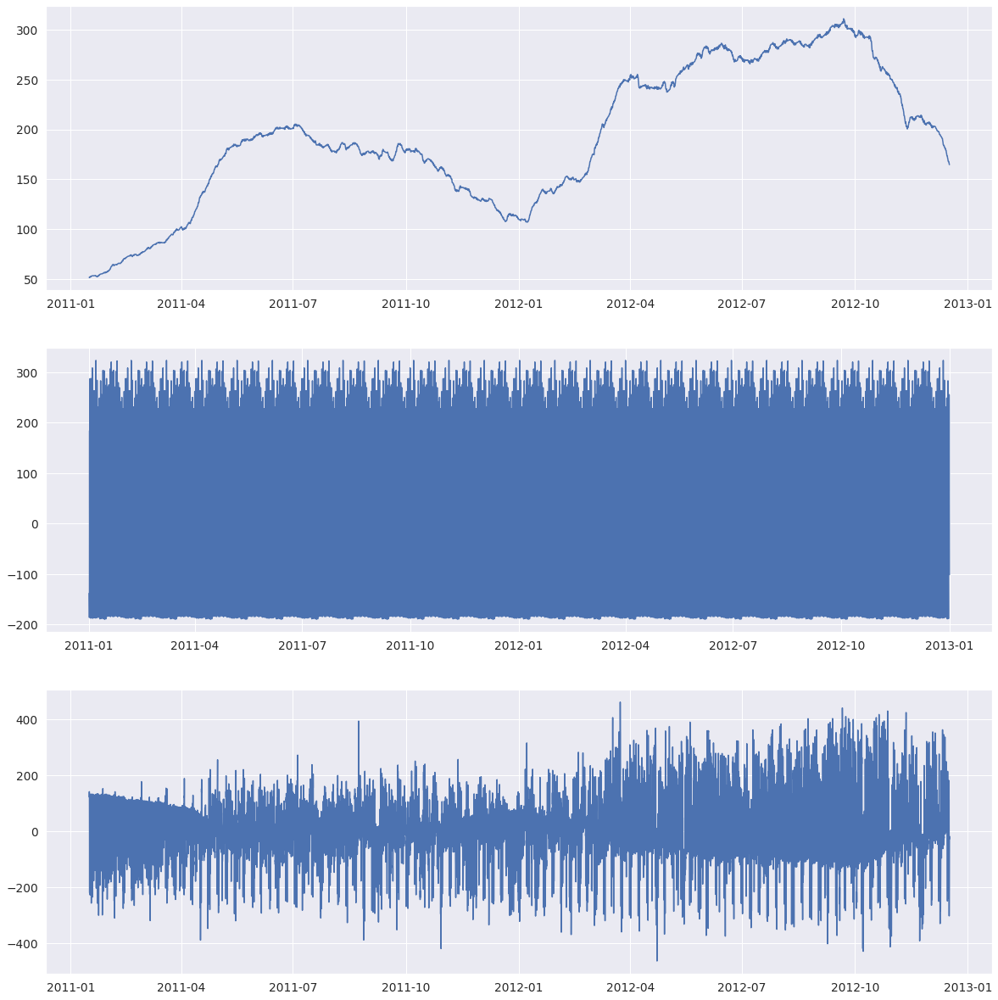

In [ ]:
decomposition = seasonal_decompose(df1['cnt'], model='additive', period=24*30)

plt.subplots(3, 1, figsize=(20, 21))

plt.subplot(3, 1, 1)
plt.plot(decomposition.trend)

plt.subplot(3, 1, 2)
plt.plot(decomposition.seasonal)

plt.subplot(3, 1, 3)
plt.plot(decomposition.resid)

#### *Subsequent Decomposition*

Let us extract separately day- and week-periodic seasonal components.

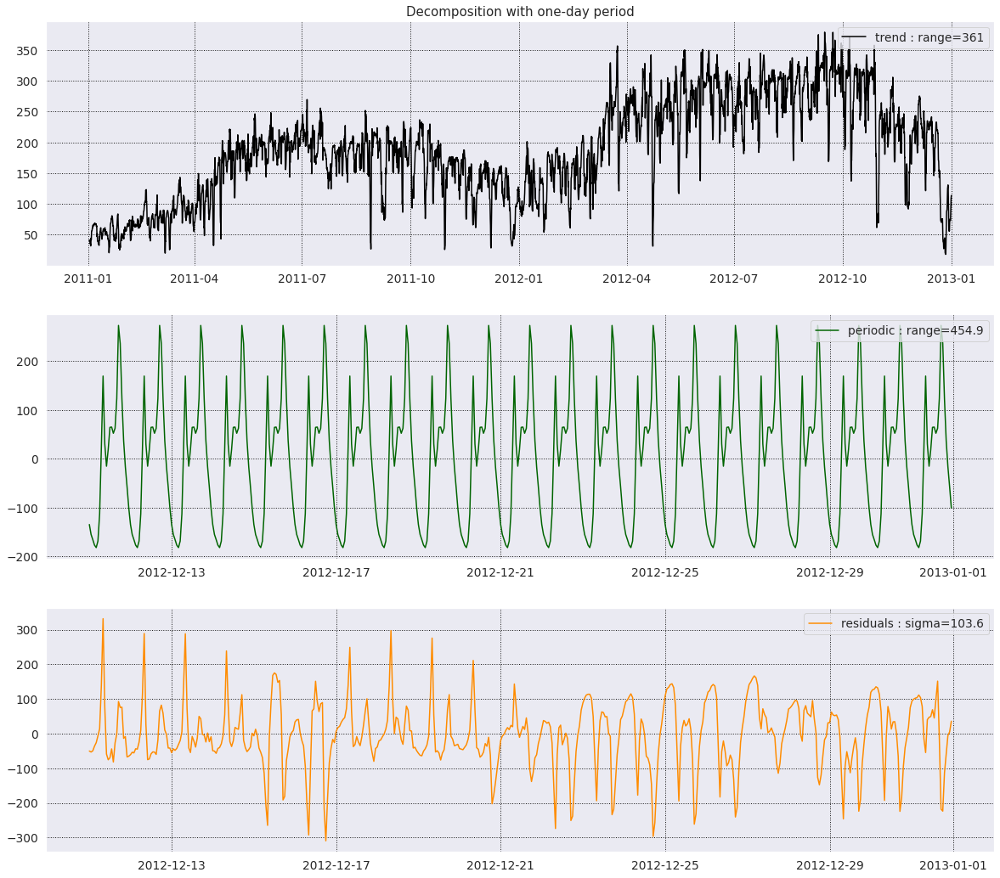

In [ ]:
decomposed_day = period_decomposition(df1['cnt'], period=24, 
                                       visualize=True, window=3*7*24, 
                                       the_title="Decomposition with one-day period")
seasonal = decomposed_day[1]

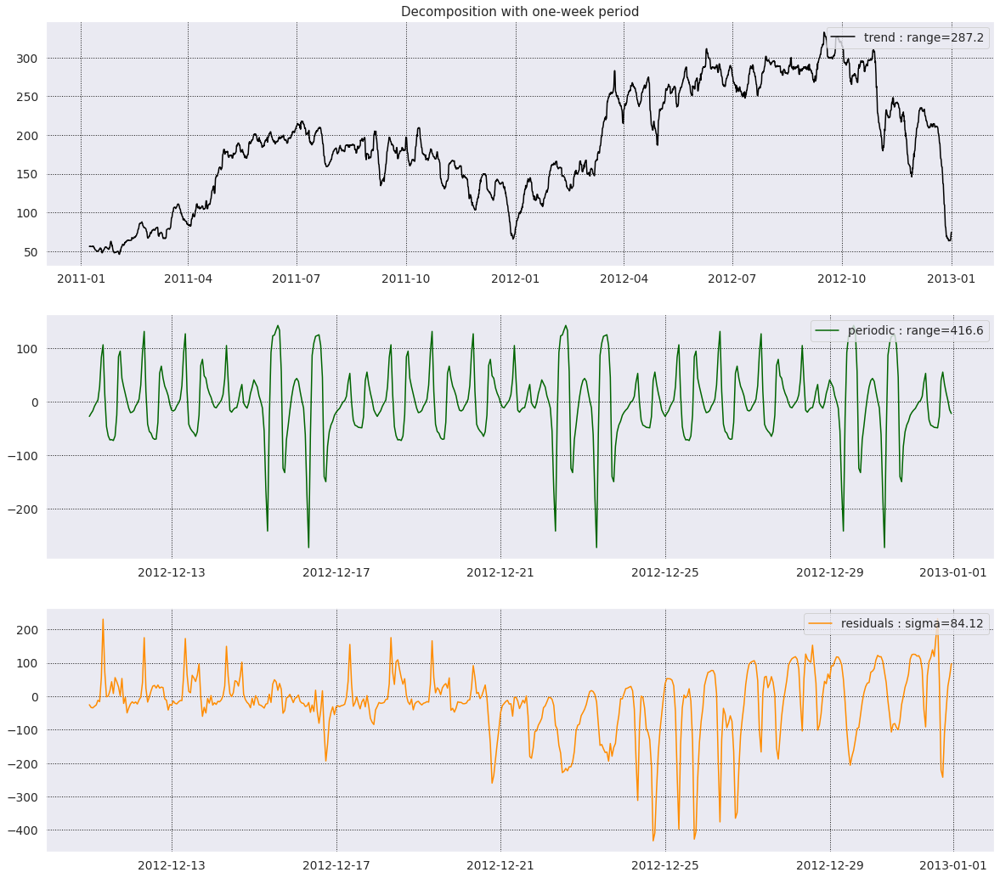

In [ ]:
decomposed_week = period_decomposition(df1['cnt']-seasonal, period=7*24, 
                                       visualize=True, window=3*7*24, 
                                       the_title="Decomposition with one-week period")

seasonal += decomposed_week[1]
trend = decomposed_week[0]
resid = decomposed_week[2]

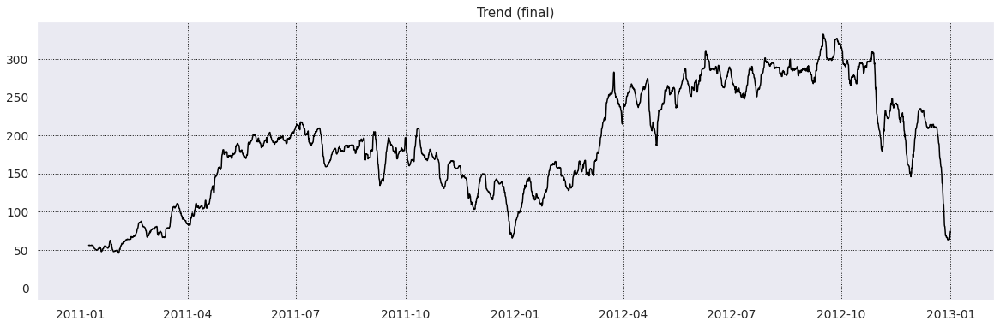

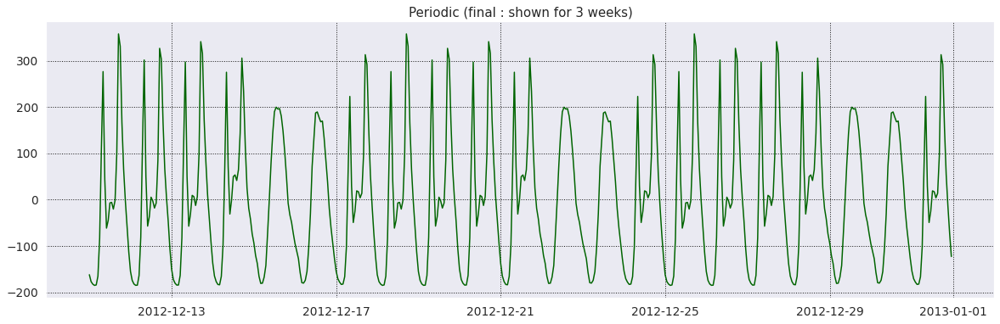

In [ ]:
plt.subplots(1, 1, figsize=(20, 6))
plt.plot(trend, '-', color='black')
plt.plot(trend.index[0], 0)
plt.title("Trend (final)")
plt.grid(linestyle=':', color='k')
plt.show()

plt.subplots(1, 1, figsize=(20, 6))
plt.plot(seasonal[-3*7*24:], '-', color='darkgreen')
plt.title("Periodic (final : shown for 3 weeks)")
plt.grid(linestyle=':', color='k')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)


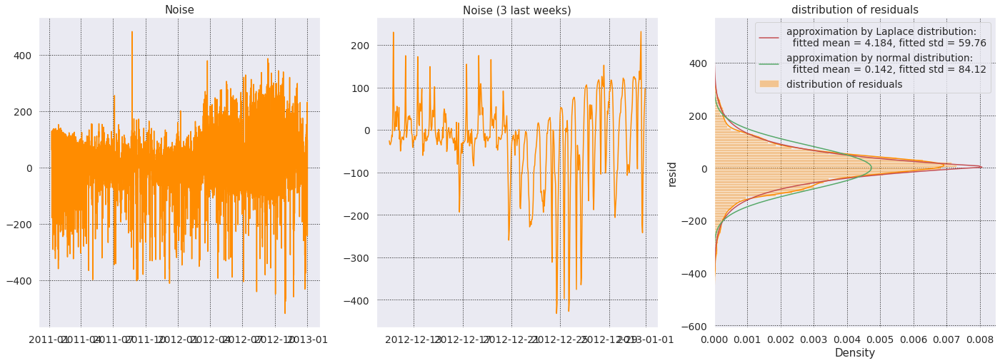

In [ ]:
plt.subplots(1, 3, figsize=(24, 8))

plt.subplot(1, 3, 1)
plt.plot(resid, '-', color='darkorange')
plt.grid(linestyle=':', color='k')
plt.title("Noise")


plt.subplot(1, 3, 2)
plt.plot(resid.dropna()[-3*7*24:], '-', color='darkorange')
plt.title("Noise (3 last weeks)")
plt.grid(linestyle=':', color='k')


x_fit = np.linspace(resid.min(), resid.max(), 201)
loc_laplace, scale_laplace = st.laplace.fit(resid.dropna())
loc_norm, scale_norm = st.norm.fit(resid.dropna())
# print(f"Fitting of residuals by Laplace distribution: fitted mean = {loc:.3f}, fitted std = {scale:.3f}")
y_fit_laplace = st.laplace.pdf(x_fit, loc_laplace, scale_laplace)
y_fit_norm = st.norm.pdf(x_fit, loc_norm, scale_norm)


plt.subplot(1, 3, 3)
sns.distplot(resid, color='darkorange', bins=100, vertical=True, label="distribution of residuals")
plt.plot(y_fit_laplace, x_fit, '-r', 
         label=f"approximation by Laplace distribution:\n  fitted mean = {loc_laplace:.4g}, fitted std = {scale_laplace:.4g}")
plt.plot(y_fit_norm, x_fit, '-g', 
         label=f"approximation by normal distribution:\n  fitted mean = {loc_norm:.4g}, fitted std = {scale_norm:.4g}")
plt.legend()
# plt.ylim(resid-0.02*y_range, y_max+0.02*y_range)
plt.title("distribution of residuals")
plt.grid(linestyle=':', color='k')

plt.show()

In [ ]:
resid.isna().sum()

168

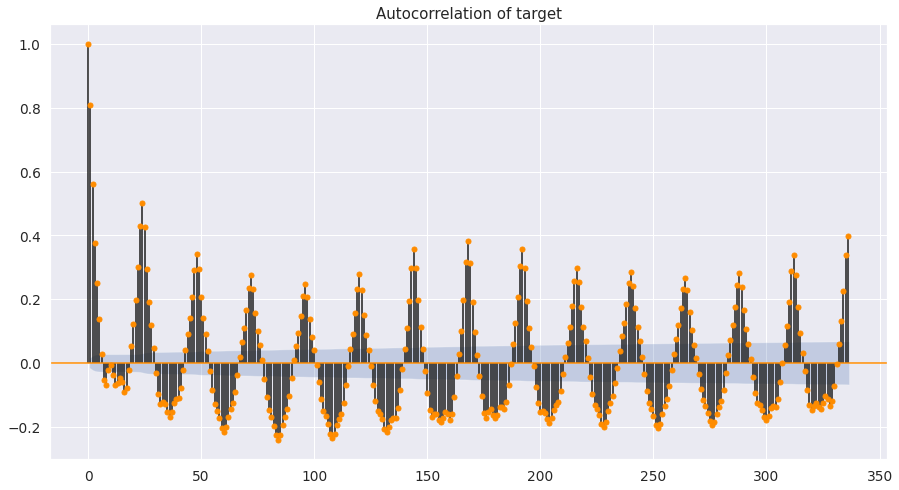

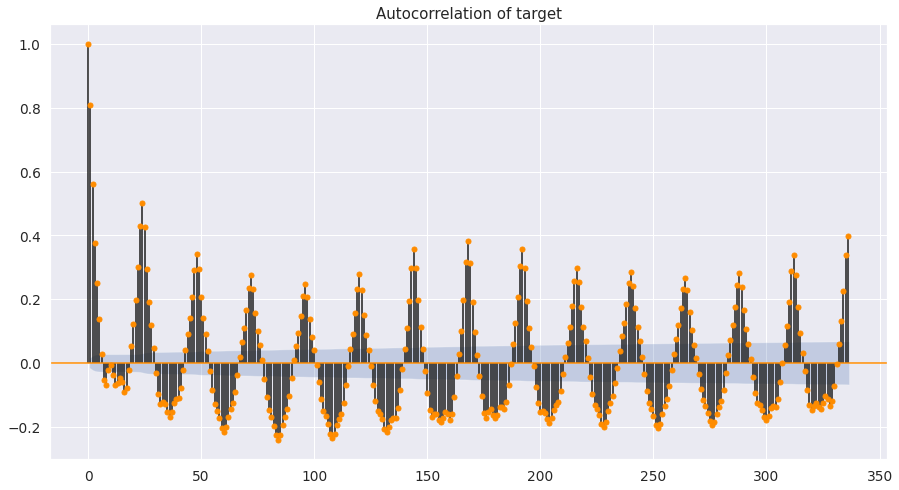

In [ ]:
lags = 14*24

plot_acf(resid.dropna(), lags=lags, color='darkorange', 
         title='Autocorrelation of target')

The distribution of residuals is pretty close to Laplace distribution. But residuas are not white noise, they contains at least both day- and week periodic components.

TODO 
- [ ] Add year-periodic decompostion
- [ ] Add "built-in" decomposition as a final step
- [ ] Compare results with the results of "*simplest decomposition*" (see above).

#### *Test for trend stationarity*

Let us check the trend for the stationarity.

In [ ]:
alpha = 0.05


print(f"alpha = {alpha}\n")
# ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(trend.dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
if result[1] < alpha:
  print("The process is stationary.\n")
else:
  print("The process is non-stationary.\n") 

alpha = 0.05

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -2.305181006496942
p-value: 0.17030243830434877
The process is non-stationary.



In [ ]:
print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):')
# kpss test
kpsstest = kpss(trend.dropna(), regression='c')
print("KPSS Statistic = " + str(kpsstest[0]))
print( "p-value = " +str(kpsstest[1]))
if kpsstest[1] < alpha:
  print("The process is non-stationary.\n")
else:
  print("The process is stationary.\n")

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):
KPSS Statistic = 21.19681435508308
p-value = 0.01
The process is non-stationary.



/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1843: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)


The trend is non-stationary. Let us calculate the first derivative of the trend abd check it for the stationarity.

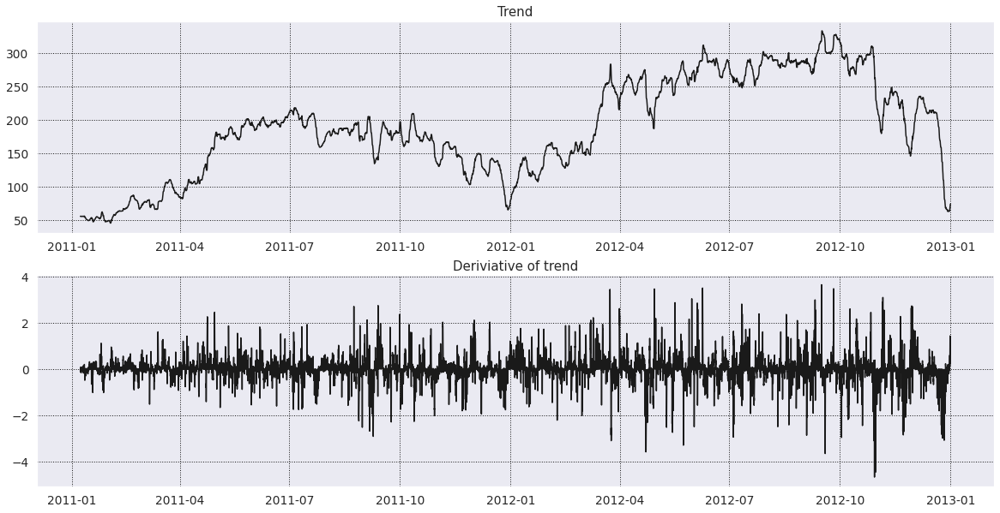

In [ ]:
plt.subplots(1, 1, figsize=(20, 10))

plt.subplot(2, 1, 1)
plt.plot(trend, '-k')
plt.title("Trend")
plt.grid(linestyle=':', color='k')

trend_diff = trend.diff()
plt.subplot(2, 1, 2)
plt.plot(trend_diff, '-k')
plt.title("Deriviative of trend")
plt.grid(linestyle=':', color='k')


plt.show()

In [ ]:
alpha = 0.05
print(f"alpha = {alpha}\n")
### ADF Test
print("==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): ")
result = adfuller(trend_diff.dropna(), autolag='AIC')
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
if result[1] < alpha:
  print("The process is stationary.\n")
else:
  print("The process is non-stationary.\n")

alpha = 0.05

==== Augmented Dickey–Fuller (Null hypothesis - The process is non-stationary): 
ADF Statistic: -14.27587904351615
p-value: 1.349577219752837e-26
The process is stationary.



In [ ]:
print('==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):')
### KPSS test
### Note that if you do not drop nans, test won't fail but statistics won't be calculated.


kpsstest = kpss(trend_diff.dropna(), regression='c')
print("KPSS Statistic = " + str(kpsstest[0]))
print( "p-value = " +str(kpsstest[1]))
if kpsstest[1] < alpha:
  print("The process is non-stationary.\n")
else:
  print("The process is stationary.\n")

==== Kwiatkowski–Phillips–Schmidt–Shin (KPSS) test (Null hypothesis - The process is stationary):
KPSS Statistic = 0.35458631167804
p-value = 0.09673003806981034
The process is stationary.



/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1843: FutureWarning: The behavior of using nlags=None will change in release 0.13.Currently nlags=None is the same as nlags="legacy", and so a sample-size lag length is used. After the next release, the default will change to be the same as nlags="auto" which uses an automatic lag length selection method. To silence this warning, either use "auto" or "legacy"
  warnings.warn(msg, FutureWarning)


The first derivative of trend is stationary. This fact tells us that we should put $d=1$ fir the ARIMA model.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning,


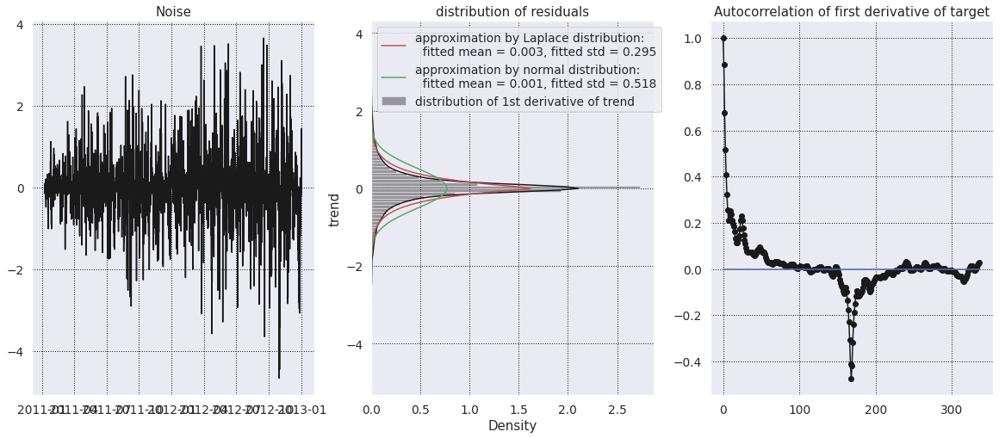

In [ ]:
y = trend_diff


plt.subplots(1, 3, figsize=(20, 8))


plt.subplot(1, 3, 1)
plt.plot(y, '-k')
plt.title("Noise")
plt.grid(linestyle=':', color='k')


x_fit = np.linspace(y.min(), y.max(), 201)
loc_laplace, scale_laplace = st.laplace.fit(y.dropna())
loc_norm, scale_norm = st.norm.fit(y.dropna())
# print(f"Fitting of residuals by Laplace distribution: fitted mean = {loc:.3f}, fitted std = {scale:.3f}")
y_fit_laplace = st.laplace.pdf(x_fit, loc_laplace, scale_laplace)
y_fit_norm = st.norm.pdf(x_fit, loc_norm, scale_norm)

plt.subplot(1, 3, 2)
sns.distplot(y, color='k', bins=100, vertical=True, label="distribution of 1st derivative of trend")
plt.plot(y_fit_laplace, x_fit, '-r', 
         label=f"approximation by Laplace distribution:\n  fitted mean = {loc_laplace:.3f}, fitted std = {scale_laplace:.3f}")
plt.plot(y_fit_norm, x_fit, '-g', 
         label=f"approximation by normal distribution:\n  fitted mean = {loc_norm:.3f}, fitted std = {scale_norm:.3f}")
plt.legend()
# plt.ylim(resid-0.02*y_range, y_max+0.02*y_range)
plt.title("distribution of residuals")
plt.grid(linestyle=':', color='k')



acf_trend_diff = acf(trend_diff, nlags=14*24, missing='conservative')

plt.subplot(1, 3, 3)
plt.plot(acf_trend_diff, '-ko') 
plt.plot([0, len(acf_trend_diff)], [0, 0], '-b')
plt.title('Autocorrelation of first derivative of target')
plt.grid(linestyle=':', color='k')

plt.show()

Though we still have not filled missing values, we can suspect the first derivative of the trend to be stationary with the distribution close to Laplace one. Autocorrelation function shows us once again that we have not done seasonal decomposition properly and still have both day- and week-periodic seasonal components.

### Correlation analysis

#### *Autocorrelation functions*

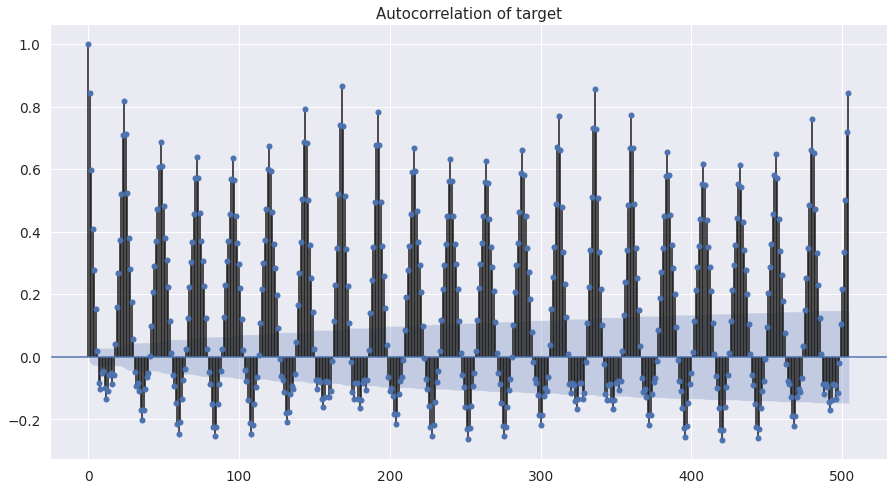

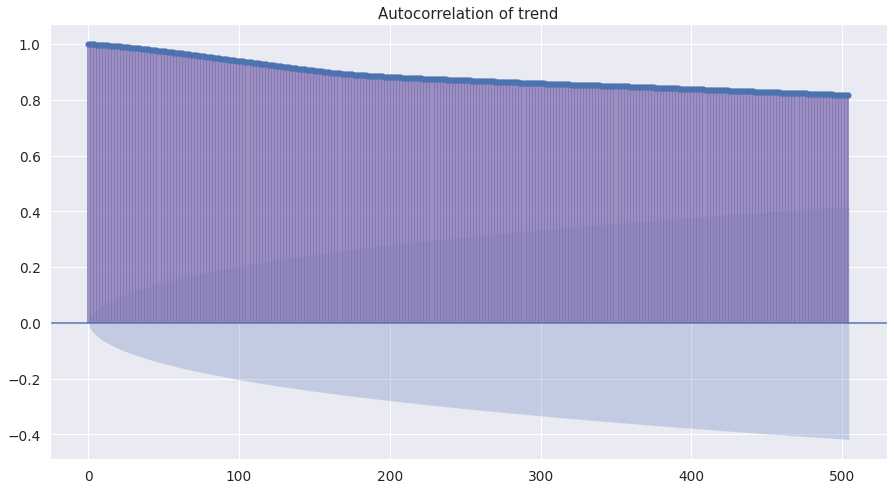

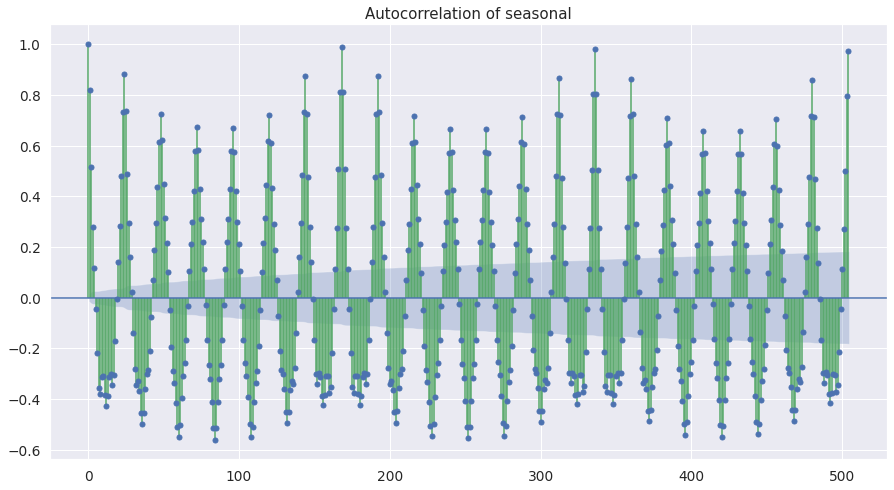

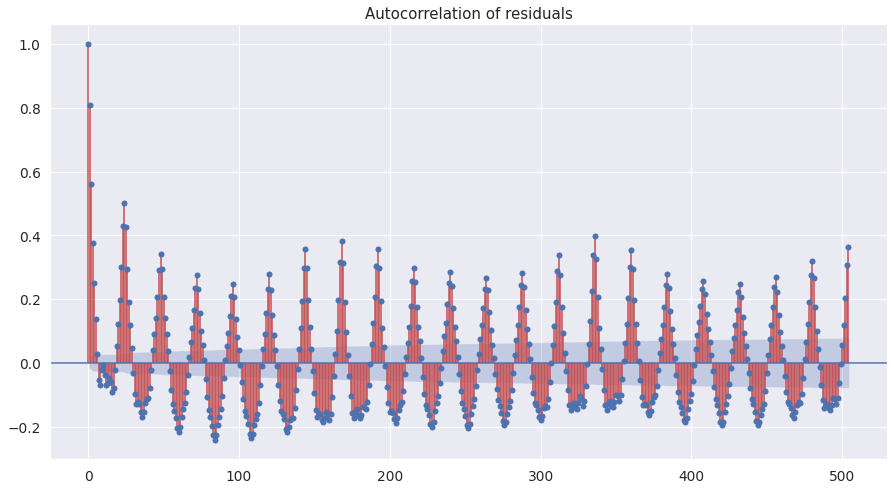

In [ ]:
lags = 3*7*24

plot_acf(df1['cnt'], lags=lags, 
         title='Autocorrelation of target')

plot_acf(trend.dropna(), lags=lags, 
         vlines_kwargs={'color' : 'm'},
         title='Autocorrelation of trend')

plot_acf(seasonal, lags=lags, 
         vlines_kwargs={'color' : 'g'},
         title='Autocorrelation of seasonal')

plot_acf(resid.dropna(), lags=lags, 
         vlines_kwargs={'color' : 'r'},
         title='Autocorrelation of residuals')

plt.show()

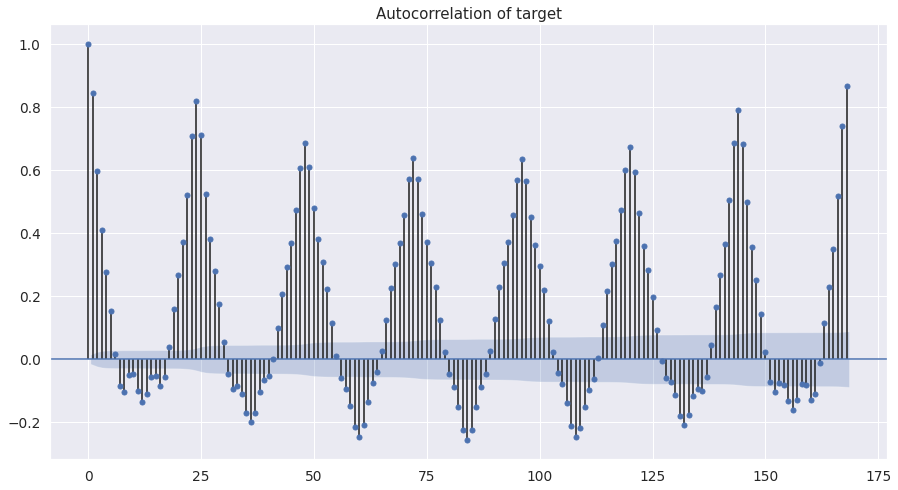

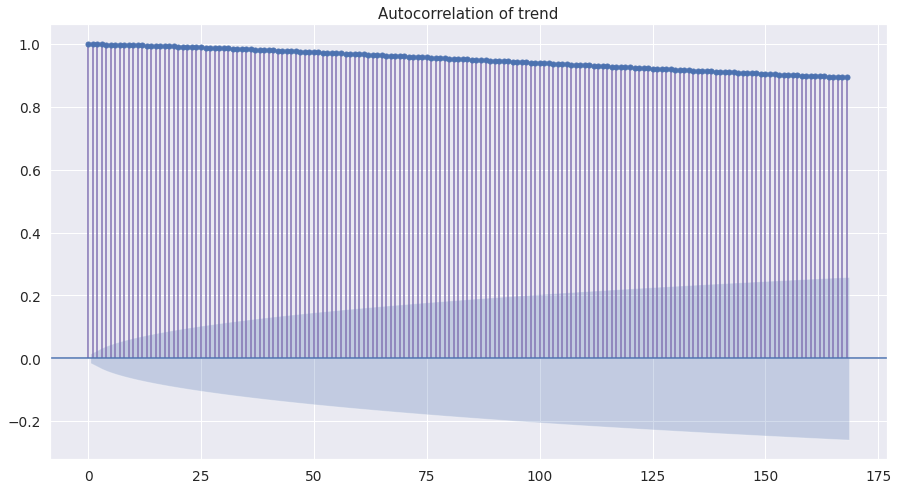

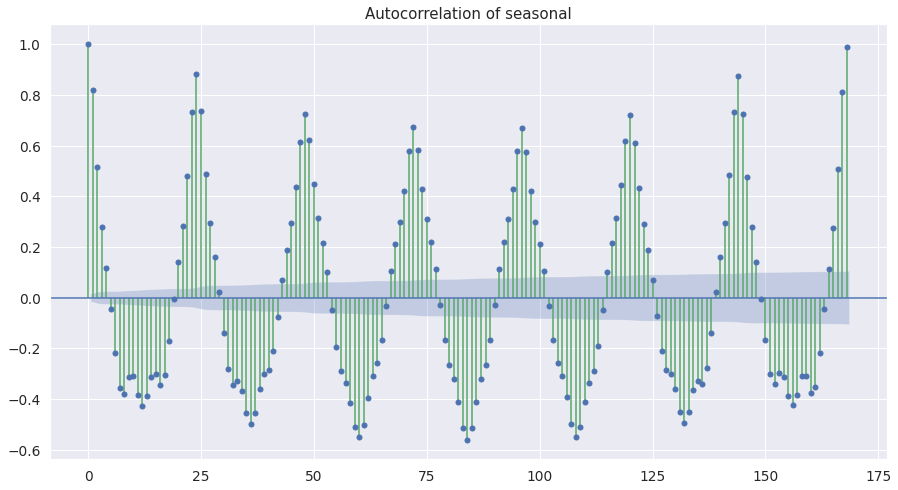

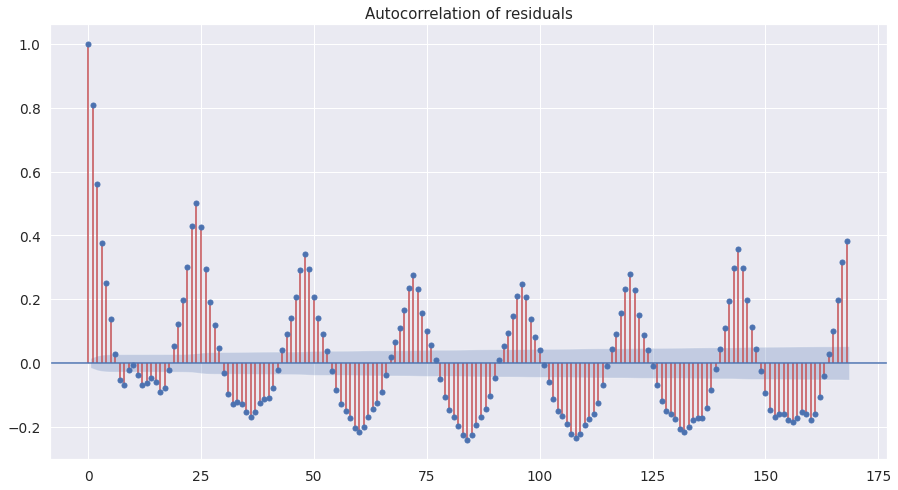

In [ ]:
lags = 7*24

plot_acf(df1['cnt'], lags=lags, 
         title='Autocorrelation of target')

plot_acf(trend.dropna(), lags=lags, 
         vlines_kwargs={'color' : 'm'},
         title='Autocorrelation of trend')

plot_acf(seasonal, lags=lags, 
         vlines_kwargs={'color' : 'g'},
         title='Autocorrelation of seasonal')

plot_acf(resid.dropna(), lags=lags, 
         vlines_kwargs={'color' : 'r'},
         title='Autocorrelation of residuals')

plt.show()

Plots of autocorrelation functions of target, trend, seasonal component, and residuals show us that
1. Target has day- and week-periodic seasonal components (proven by autocorrelation function of seasonal components).
2. Decomposition has not doneproperly and we still have both day- and week-periodic seasonal components both in trend and residuals.
3. Since the target has day- and week-periodic components we should put $p=168$ (or at least $p=24$ to catch day-periodicty) for ARIMA model.

#### *Partial Autocorrelation functions*

/usr/local/lib/python3.7/dist-packages/statsmodels/regression/linear_model.py:1434: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


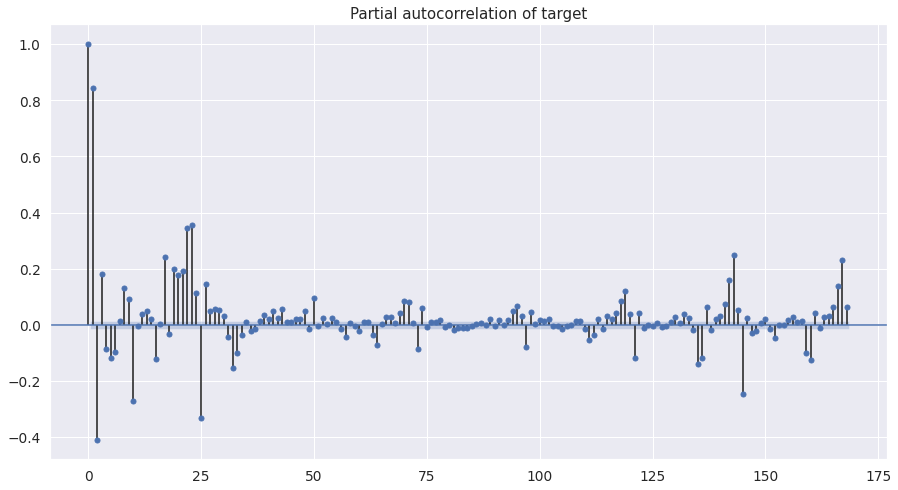

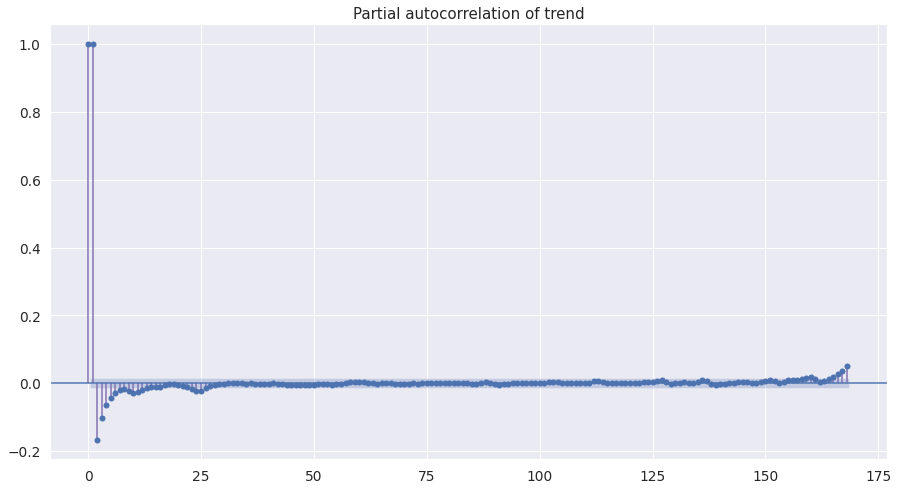

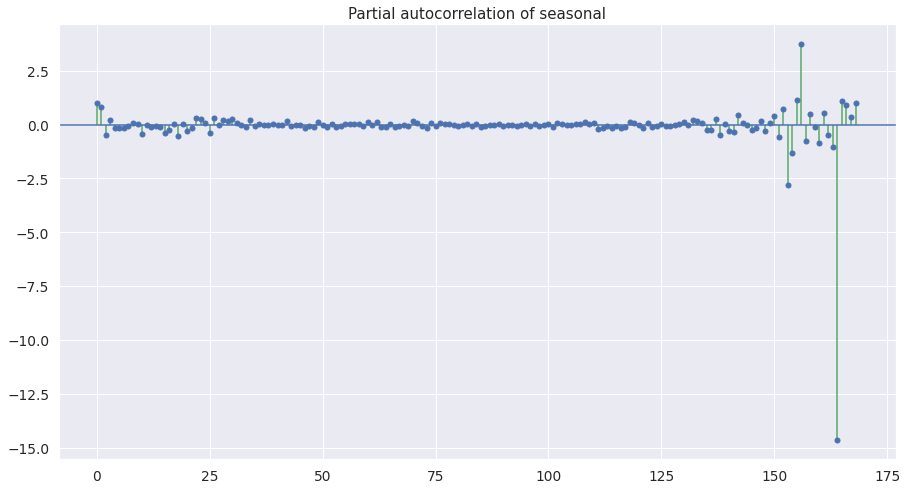

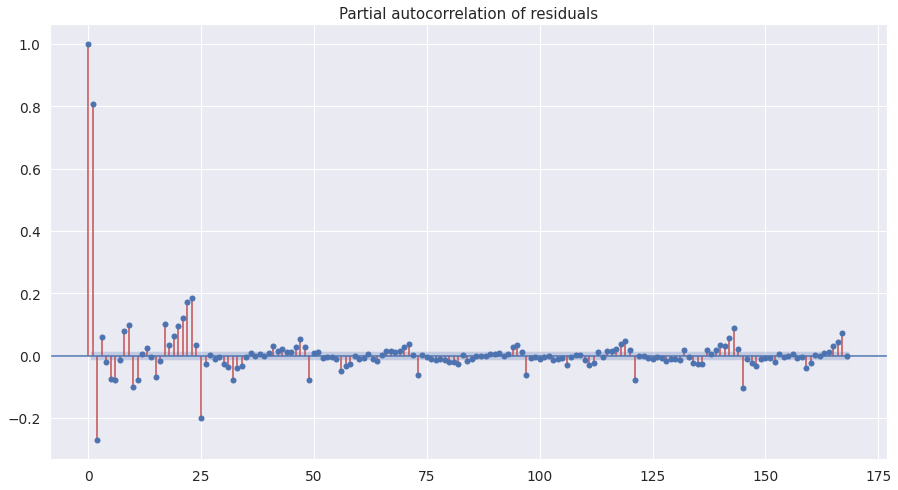

In [ ]:
lags = 7*24

plot_pacf(df1['cnt'], lags=lags, 
          title='Partial autocorrelation of target')

plot_pacf(trend.dropna(), lags=lags, 
          vlines_kwargs={'color' : 'm'},
          title='Partial autocorrelation of trend')

plot_pacf(seasonal, lags=lags, 
          vlines_kwargs={'color' : 'g'},
          title='Partial autocorrelation of seasonal')

plot_pacf(resid.dropna(), lags=lags, 
          vlines_kwargs={'color' : 'r'},
          title='Partial autocorrelation of residuals')

plt.show()

Partial autocorrelation functions of trend shows us that we have significant value for lag corresponding to 24 hours. Therefore the minimal value that we should choose for $q$ for ARIMA model is $q=24$.

#### *Lag dependencies*

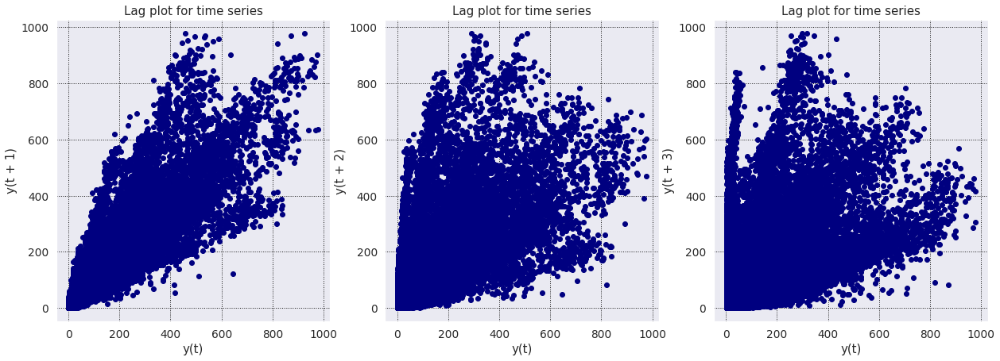

In [ ]:
### Draw a Lag plot
plt.subplots(1, 3, figsize=(21, 7))

for k in range(1, 4):
    plt.subplot(1, 3, k)
    pd.plotting.lag_plot(df1['cnt'], lag=k, c='navy')
    plt.title("Lag plot for time series")
    plt.grid(linestyle=':', color='k')

plt.show()

The lag dependencies (dependencies of $y(t+k)$ on $y(t)$) allow us to suspect four (from dependencies for $k=1$ and especially for $k=3$) or even 6 (from dependency for $k=2$) different processes that make up our target. We can suspect different processes for *workingdays*, *holidays* and *weekends*. May be we can expect different behaviour of people in winter and summer. In a real combat situation, these ideas should be checked.

*I consider linear correlation dependenies: $y(t+k) = \alpha_ky(t)$.*

## Linear regression with decomposed features

Let us create an Linear regression model using, in particular, our new knowledge concerning trend and seasonal components.

1. Let us put aside seasonal components as a function of time, that will be added further.

2. We construct our Linear Regression model as a model for trend, which we add finally known seasonal components. We construct this "model for trend" in two variants:
* We construct "dynamic" model using autoregression and moving average components, pretending that we make predictions knowing all data at this time.
* We construct "static" model using power series of time approach, pretending that all data that we know are our train dataset.

### Seasonal component as time-dependent function

In [ ]:
seasonal[::7*24]

2011-01-01   -93.40748
2011-01-08   -93.40748
2011-01-15   -93.40748
2011-01-22   -93.40748
2011-01-29   -93.40748
                ...   
2012-12-01   -93.40748
2012-12-08   -93.40748
2012-12-15   -93.40748
2012-12-22   -93.40748
2012-12-29   -93.40748
Freq: 168H, Name: seasonal, Length: 105, dtype: float64

In [ ]:
def seasonal_component(ind):
    seasonal_unit = seasonal[:7*24]
    seasonal_unit.index = (seasonal_unit.index - seasonal_unit.index[0])%pd.Timedelta(7, 'D')

    ind_norm = (ind - seasonal.index[0])%pd.Timedelta(7, 'D')   

    return seasonal_unit[ind_norm].values

### 'Dynamic' model


#### *'Dynamic' predicting for trend*

In [ ]:
trend

2011-01-01 00:00:00          NaN
2011-01-01 01:00:00          NaN
2011-01-01 02:00:00          NaN
2011-01-01 03:00:00          NaN
2011-01-01 04:00:00          NaN
                         ...    
2012-12-31 19:00:00    72.985119
2012-12-31 20:00:00    73.482143
2012-12-31 21:00:00    73.880952
2012-12-31 22:00:00    74.229167
2012-12-31 23:00:00    74.488095
Freq: H, Name: trend, Length: 17544, dtype: float64

**NB** Creating feature based on rolling window with aggregating functions one should keep in mind possible data leaks, i.e., any such feature should not include current (or moreover future) values.

I choose to create AR and MA features for 4 hour lags, 4 day lags, and 4 week lags. I create two types of MA with width of rolling window in 8 and 24 hours, trying do not loose dependence of target inside one day for the first case, and, on the contrary, to smooth such a dependence in favor of week-periodicity.

In [ ]:
# ### Adding the lag of the target variable 
# ### 1 step back (1 hour), 
# ### 2 steps back (2 hours), ...
# ### 24 steps back (1 day), 
# ### 24*7 steps back (1 week)

df2 = df1.copy()
df2['trend'] = trend
df2 = df2.dropna()

lags = [1, 2, 3, 4] + list(24*np.array([1, 2, 3, 4])) + list(24*7*np.array([1, 2, 3, 4]))

for lag in lags:
    df2['lag_'+str(lag)] = df2['trend'].shift(lag)
    df2['MA_8h_'+str(lag)] = df2['trend'].shift(lag).rolling(window=8).mean()
    df2['MA_24h_'+str(lag)] = df2['trend'].shift(lag).rolling(window=24).mean()
    
print(df2.columns)
df2.head()

Index(['cnt', 'trend', 'lag_1', 'MA_8h_1', 'MA_24h_1', 'lag_2', 'MA_8h_2',
       'MA_24h_2', 'lag_3', 'MA_8h_3', 'MA_24h_3', 'lag_4', 'MA_8h_4',
       'MA_24h_4', 'lag_24', 'MA_8h_24', 'MA_24h_24', 'lag_48', 'MA_8h_48',
       'MA_24h_48', 'lag_72', 'MA_8h_72', 'MA_24h_72', 'lag_96', 'MA_8h_96',
       'MA_24h_96', 'lag_168', 'MA_8h_168', 'MA_24h_168', 'lag_336',
       'MA_8h_336', 'MA_24h_336', 'lag_504', 'MA_8h_504', 'MA_24h_504',
       'lag_672', 'MA_8h_672', 'MA_24h_672'],
      dtype='object')


,cnt,trend,lag_1,MA_8h_1,MA_24h_1,lag_2,MA_8h_2,MA_24h_2,lag_3,MA_8h_3,MA_24h_3,lag_4,MA_8h_4,MA_24h_4,lag_24,MA_8h_24,MA_24h_24,lag_48,MA_8h_48,MA_24h_48,lag_72,MA_8h_72,MA_24h_72,lag_96,MA_8h_96,MA_24h_96,lag_168,MA_8h_168,MA_24h_168,lag_336,MA_8h_336,MA_24h_336,lag_504,MA_8h_504,MA_24h_504,lag_672,MA_8h_672,MA_24h_672
2011-01-08 00:00:00,25,56.110119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-08 01:00:00,16,56.065476,56.110119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-08 02:00:00,16,55.946429,56.065476,NaN,NaN,56.110119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-08 03:00:00,7,55.880952,55.946429,NaN,NaN,56.065476,NaN,NaN,56.110119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-08 04:00:00,1,55.863095,55.880952,NaN,NaN,55.946429,NaN,NaN,56.065476,NaN,NaN,56.110119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df2.dropna(inplace=True)

indx_test = df2.index > (df2.index.max() - pd.Timedelta(days=TEST_DAYS))
#1.5 years train, 6 months test

df2_test = df2.loc[indx_test].copy(deep=True)
df2_train = df2.loc[~indx_test].copy(deep=True)

print(f"For training : {df2_train.shape[0]} points")
print(f"For test     : {df2_test.shape[0]} points")

X_train = df2_train.drop(['cnt', 'trend'], axis=1)
y_train = df2_train['trend']

X_test = df2_test.drop(['cnt', 'trend'], axis=1)
y_test = df2_test['trend']

For training : 15937 points
For test     : 744 points


In [ ]:
t0 = time.time()

pipe = Pipeline([('scaler', MinMaxScaler()), ('lm', LinearRegression())])
cv_ts = TimeSeriesSplit(n_splits=5)
cross_val_score(pipe, X_train, y_train, cv=cv_ts, 
                scoring='neg_mean_absolute_error')

pipe.fit(X_train, y_train);
model = pipe.named_steps['lm']

t_train = time.time() - t0

df2_test['prediction_lm_trend'] = pipe.predict(X_test)
df2_train['prediction_lm_trend'] = pipe.predict(X_train)

MAE = mean_absolute_error(y_true=df2_test['trend'],
                   y_pred=df2_test['prediction_lm_trend'])

loc_last = len(results_df)
results_df.loc[loc_last, 'Model'] = "* LinReg_dynamic(trend_only)"
results_df.loc[loc_last, 'MAE'] =  MAE
results_df.loc[loc_last, 'train_time_sec'] =  t_train
results_df

,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279


One can see that the dynamic forecasting provides us astonishing results due to the using of of all currently available data - forecasting "from hour to hour".

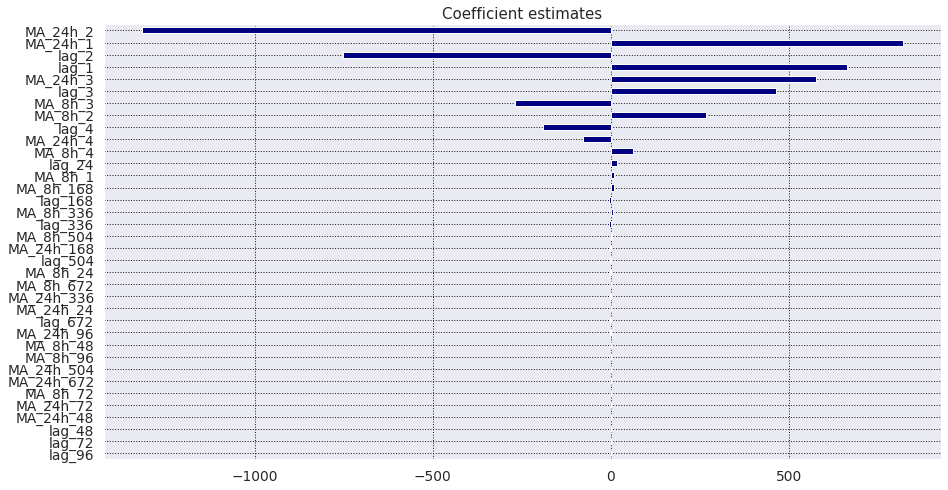

MA_24h_2     -1317.762212
MA_24h_1       821.431860
lag_2         -752.180337
lag_1          664.895397
MA_24h_3       577.108242
lag_3          465.575678
MA_8h_3       -268.835407
MA_8h_2        267.090505
lag_4         -191.159348
MA_24h_4       -78.638259
MA_8h_4         62.315136
lag_24          16.523843
MA_8h_1          9.386334
MA_8h_168        8.430371
lag_168         -6.030789
MA_8h_336        5.666839
lag_336         -4.321233
MA_8h_504        2.584753
MA_24h_168      -2.194166
lag_504         -2.082749
MA_8h_24        -1.449523
MA_8h_672        1.352193
MA_24h_336      -1.306034
MA_24h_24        1.016546
lag_672         -0.953941
MA_24h_96       -0.658643
MA_8h_48        -0.581847
MA_8h_96         0.501745
MA_24h_504      -0.469040
MA_24h_672      -0.463483
MA_8h_72         0.216564
MA_24h_72       -0.199620
MA_24h_48        0.128237
lag_48           0.068724
lag_72          -0.030914
lag_96           0.027422
Name: coef, dtype: float64

In [ ]:
plot_coefficients(model, X_train)

The most important features for this model are:
* first 4 moving averages with window = 24 hours,
* first autoregession terms with lags from 1 up to 4 hours, and
* moving averages with window = 8 hours for lags = 2, 3, and 4 hours.

It suggests that we should take $p\geq4$ and $q\geq4$ for future ARIMA model.

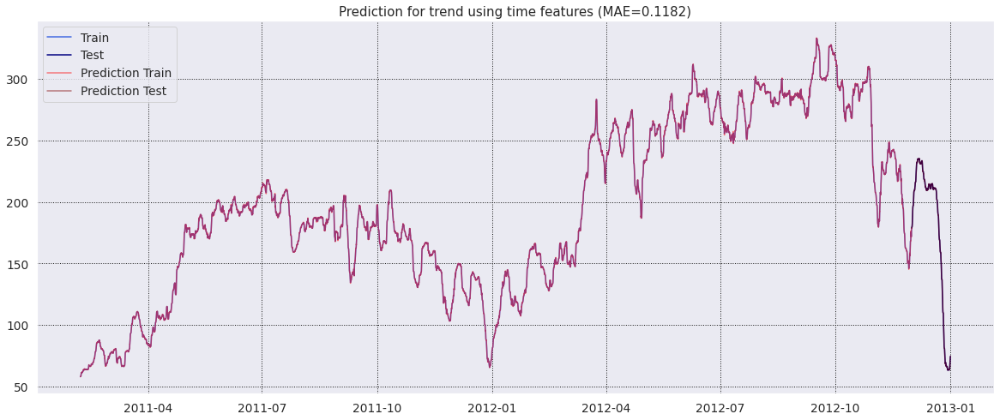

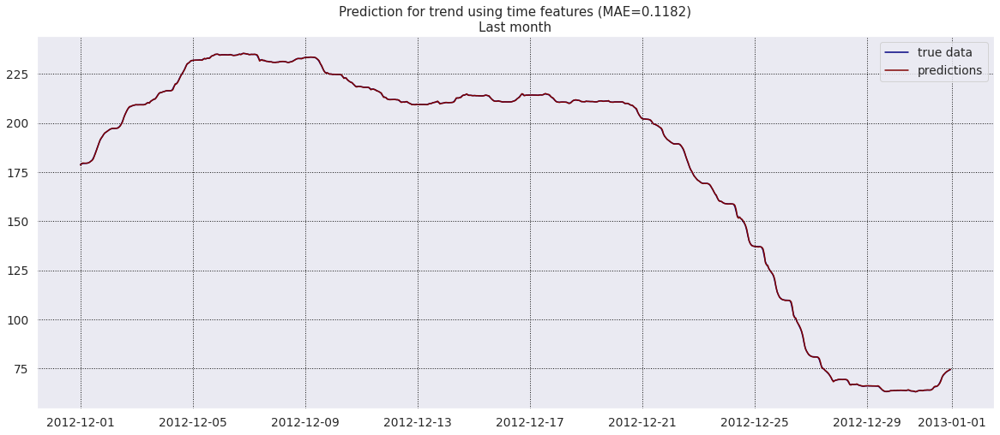

In [ ]:
plot_prediction(df2_train, df2_test, 'trend', 'prediction_lm_trend', 
                enlrgd_since='2012-10-01', 
                title=f'Prediction for trend using time features (MAE={MAE:.4g})')

We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

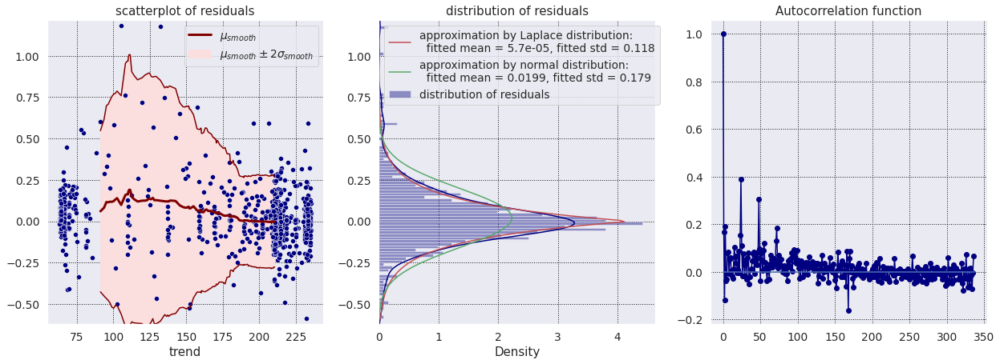

In [ ]:
residual_plots(df2_test['trend'], df2_test['prediction_lm_trend'], smooth_window=50)

The vast majority of errors has absolute values less than 0.5 which is less than the rounding error and therefore we achieved the theoretical limitation. Nevertheless we can conclude that the distribution od errors is closed to Laplace distribution, while autocorrelation function shows us that these errors can not be depicted as white noise and still have day- and week - periodic components. The latter fact is expected since we can not exclude these components from trend during decomposition procedure.

#### *Total predicting*

In [ ]:
t0 = time.time()

df2_test['prediction_lm_dynamic'] = pipe.predict(X_test) + seasonal_component(X_test.index)
df2_test['prediction_lm_dynamic'] = np.where(df2_test['prediction_lm_dynamic']>0, 
                                             df2_test['prediction_lm_dynamic'].astype(int), 0)

df2_train['prediction_lm_dynamic'] = pipe.predict(X_train) + seasonal_component(X_train.index)
df2_train['prediction_lm_dynamic'] = np.where(df2_train['prediction_lm_dynamic']>0, 
                                              df2_train['prediction_lm_dynamic'].astype(int), 0)
t_add = time.time() - t0

MAE = mean_absolute_error(y_true=df2_test['cnt'],
                          y_pred=df2_test['prediction_lm_dynamic'])
print(f"Mean_absolute_error = {MAE:.3f}")

loc_last = len(results_df)
results_df.loc[loc_last, 'Model'] = "* LinReg_dynamic(trend_only)"
results_df.loc[loc_last, 'MAE'] =  MAE
results_df.loc[loc_last, 'train_time_sec'] =  t_train + t_add
results_df

Mean_absolute_error = 55.923


,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193


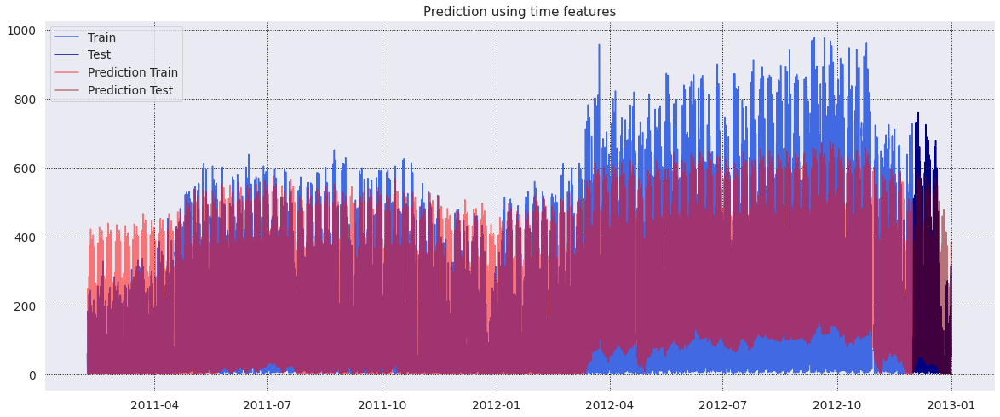

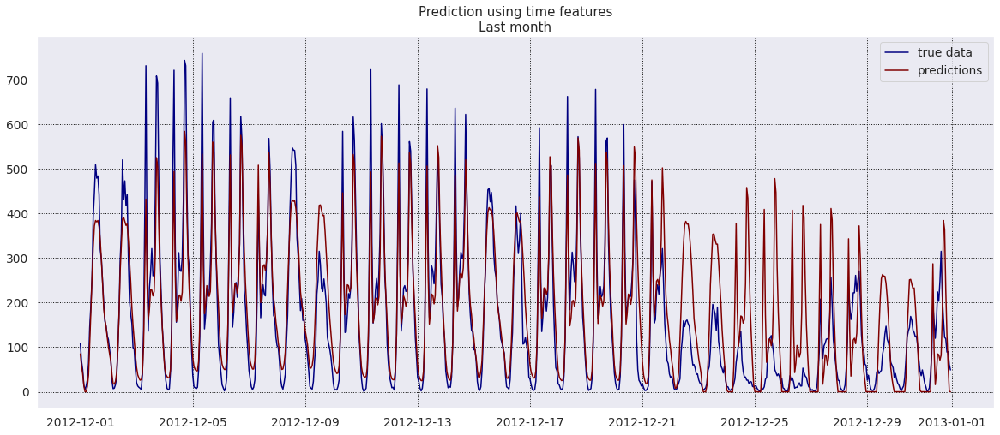

In [ ]:
plot_prediction(df2_train, df2_test, 'cnt', 'prediction_lm_dynamic', 
                enlrgd_since='2012-10-01', 
                title='Prediction using time features')

We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

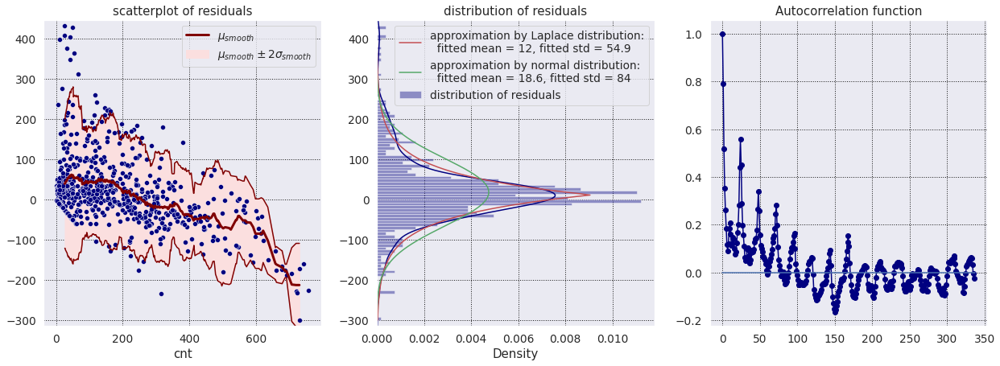

In [ ]:
residual_plots(df2_test['cnt'], df2_test['prediction_lm_dynamic'], smooth_window=50)

Dynamic predicting of trend allows us to improve model preformance drasticalyy. But this approach is used here just as as illustration of dynamic predicting.

We still have a strong bias in residual errors which have a distribution that is close to Laplace distribution. The autocorrelation function still shoes that errors are not white noise and contains day- and week-periodic signals.

# Linear regression with decomposed and exogeneous features

In [ ]:
data_full.head(3)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
2011-01-01 00:00:00,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
2011-01-01 01:00:00,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2011-01-01 02:00:00,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32


In [ ]:
# df_x = data_full['cnt'].copy()
df_x = data_full.copy()
df_x.drop(['instant', 'casual', 'registered'], axis=1, inplace=True)

### Using `resample` allows us to higlight missing data
df_x = df_x.resample('1h').mean()

print(f"We have {len(df_x[df_x.isna()])} nans amongst {len(df_x)} points.")
# display(df_x.head(100))


df_x_ffill = df_x.fillna(method = 'ffill')
df_x_bfill = df_x.fillna(method = 'bfill')

df_x[df_x.isna()] = ( df_x_ffill[df_x.isna()] + df_x_bfill[df_x.isna()] )/2
print(f"We have {len(df1[df1.isna()])} nans amongst {len(df1)} points after filling nans.")

print()
print("Now time steps are:")
pd.Series(df1.index).diff().value_counts()

We have 17544 nans amongst 17544 points.
We have 17544 nans amongst 17544 points after filling nans.

Now time steps are:


0 days 01:00:00    17543
dtype: int64

In [ ]:
df_x['year'] = df_x.index.year
df_x['month'] = df_x.index.month
df_x['dayofyear'] = df_x.index.dayofyear
df_x['day'] = df_x.index.day
df_x['hour'] = df_x.index.hour
df_x['dayofweek'] = df_x.index.dayofweek

working_days = []
business_days = pd.bdate_range(start=df_x.index.min(), end=df_x.index.max())
for x in pd.DatetimeIndex(df_x.index.date):
    if x in business_days:
        working_days.append(1)
    else:
        working_days.append(0)
df_x['working_day'] = working_days

df_x['seasonal'] = seasonal

df_x.drop(['season', 'yr', 'mnth', 'hr', 'holiday', 'weekday', 'workingday'], 
          axis=1, inplace=True)

df_x['weathersit'] = df_x['weathersit'].astype('int')
df_x['cnt'] = df_x['cnt'].astype('int')

display(df_x.head(100))

,weathersit,temp,atemp,hum,windspeed,cnt,year,month,dayofyear,day,hour,dayofweek,working_day,seasonal
2011-01-01 00:00:00,1,0.24,0.28790,0.81,0.00000,16,2011,1,1,1,0,5,0,-93.407480
2011-01-01 01:00:00,1,0.22,0.27270,0.80,0.00000,40,2011,1,1,1,1,5,0,-120.417296
2011-01-01 02:00:00,1,0.22,0.27270,0.80,0.00000,32,2011,1,1,1,2,5,0,-137.791838
2011-01-01 03:00:00,1,0.24,0.28790,0.75,0.00000,13,2011,1,1,1,3,5,0,-165.483573
2011-01-01 04:00:00,1,0.24,0.28790,0.75,0.00000,1,2011,1,1,1,4,5,0,-180.743045
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-01-04 23:00:00,1,0.20,0.22730,0.69,0.08960,11,2011,1,4,4,23,1,1,-112.888646
2011-01-05 00:00:00,1,0.20,0.25760,0.64,0.00000,6,2011,1,5,5,0,2,1,-154.860156
2011-01-05 01:00:00,1,0.16,0.19700,0.74,0.08960,6,2011,1,5,5,1,2,1,-174.268038
2011-01-05 02:00:00,1,0.16,0.19700,0.74,0.08960,2,2011,1,5,5,2,2,1,-181.899106


In [ ]:
indx_test = df_x.index > (df_x.index.max() - pd.Timedelta(days=TEST_DAYS))
#1.5 years train, 6 months test

df_x_test = df_x.loc[indx_test].copy(deep=True)
df_x_train = df_x.loc[~indx_test].copy(deep=True)

print(f"We have {len(df_x_train)} points ({len(df_x_train)/len(df_x):.1%}) for training.")
print(f"We have {len(df_x_test)} points ({len(df_x_test)/len(df_x):.1%}) for testing.")

y_train = df_x_train.dropna()['cnt'] - df_x_train['seasonal']
X_train = df_x_train.dropna().drop(['cnt'], axis=1)
y_test = df_x_test.dropna()['cnt']  - df_x_test['seasonal']
X_test = df_x_test.dropna().drop(['cnt'], axis=1)

print()
print(f"train : from {X_train.index[0]} till {X_train.index[-1]} .")
print(f"test  : from {X_test.index[0]} till {X_test.index[-1]} .")

We have 16800 points (95.8%) for training.
We have 744 points (4.2%) for testing.

train : from 2011-01-01 00:00:00 till 2012-11-30 23:00:00 .
test  : from 2012-12-01 00:00:00 till 2012-12-31 23:00:00 .


In [ ]:
t0 = time.time()

pipe = Pipeline([('scaler', MinMaxScaler()), 
                 ('lin_reg', LinearRegression())])
cv_ts = TimeSeriesSplit(n_splits=5)
cross_val_score(pipe, X_train, y_train, cv=cv_ts, 
                scoring='neg_mean_absolute_error')

pipe.fit(X_train, y_train);
model = pipe.named_steps['lin_reg']

t_train = time.time() - t0

df_x_train['prediction_lm_season_exog'] = pipe.predict(X_train) + df_x_train['seasonal']
df_x_train['prediction_lm_season_exog'] = np.where(df_x_train['prediction_lm_season_exog']>0, 
                                                   df_x_train['prediction_lm_season_exog'].astype(int), 0)
df_x_test['prediction_lm_season_exog'] = pipe.predict(X_test)  + df_x_test['seasonal']
df_x_test['prediction_lm_season_exog'] = np.where(df_x_test['prediction_lm_season_exog']>0, 
                                                  df_x_test['prediction_lm_season_exog'].astype(int), 0)

MAE = mean_absolute_error(y_true=df_x_test['cnt'],
                          y_pred=df_x_test['prediction_lm_season_exog'])

loc_last = len(results_df)
results_df.loc[loc_last, 'Model'] = "LinReg_season_exog"
results_df.loc[loc_last, 'MAE'] =  MAE
results_df.loc[loc_last, 'train_time_sec'] =  t_train
results_df

,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442


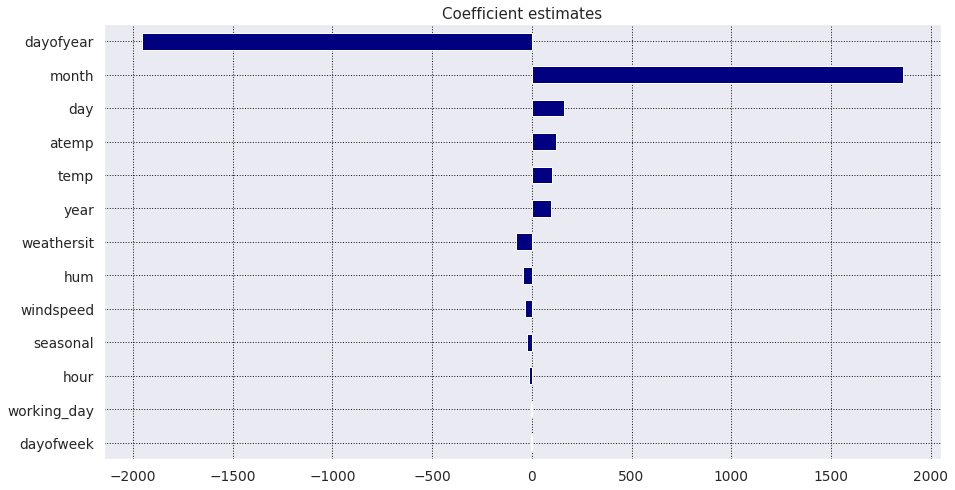

dayofyear     -1956.348265
month          1858.794748
day             160.483059
atemp           121.692885
temp            102.491731
year             94.890274
weathersit      -78.925178
hum             -42.439516
windspeed       -35.502389
seasonal        -21.807718
hour            -16.084293
working_day      -4.929026
dayofweek        -4.326221
Name: coef, dtype: float64

In [ ]:
plot_coefficients(model, X_train)

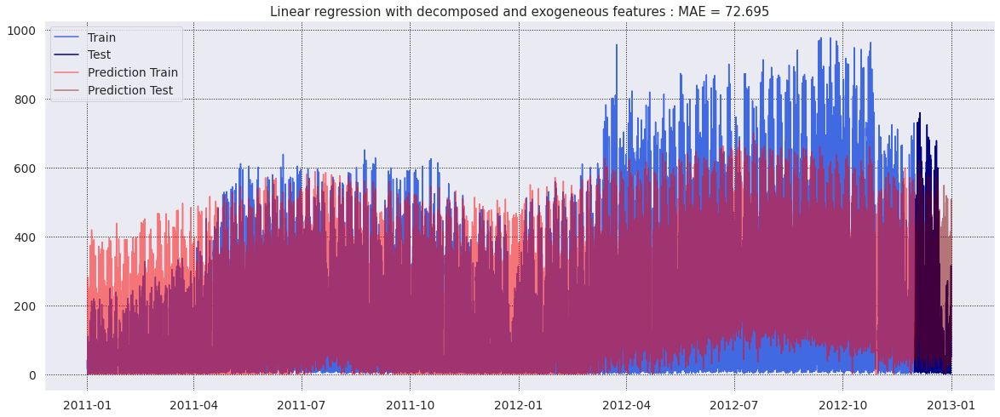

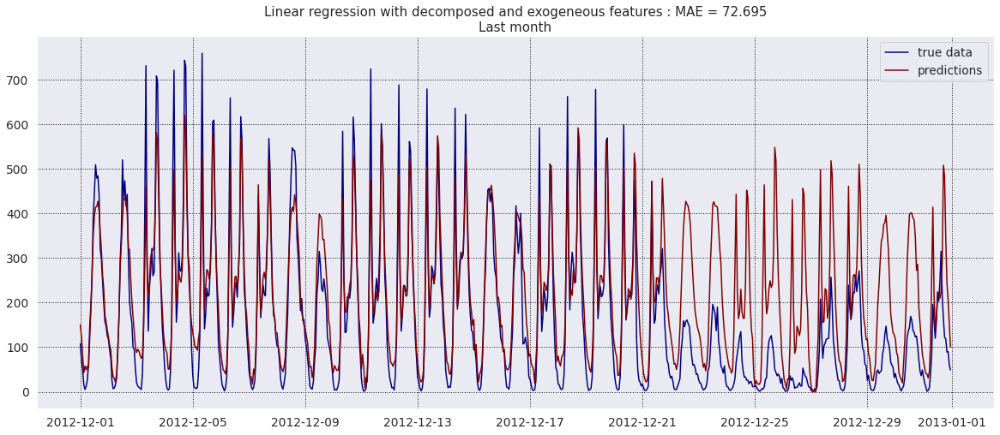

In [ ]:
plot_prediction(df_x_train, df_x_test, 'cnt', 'prediction_lm_season_exog', 
                enlrgd_since='2012-10-01', 
                title=f"Linear regression with decomposed and exogeneous features : MAE = {MAE:.3f}")

We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

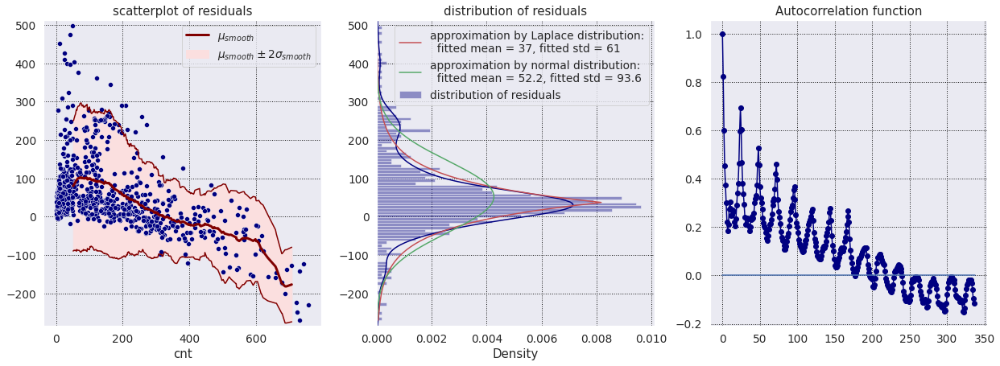

In [ ]:
residual_plots(df_x_test['cnt'], df_x_test['prediction_lm_season_exog'], smooth_window=100)

## ARIMA

In [ ]:
def arima_modelling(X_train, y_train, X_test, y_test, 
                    p=1, d=0, q=1, dynamic=True, 
                    smooth_window=50, enlrgd_since='2012-10-01'):

    t0 = time.time()

    arima_model = ARIMA(y_train, order=(p, d, q)).fit()
    print(f"ARIMA model ({p}, {d}, {q}):")
    print(arima_model.params)



    t_train = time.time() - t0

    df_arima_train[f'prediction_arima_{p}_{d}_{q}'] = arima_model.predict(X_train[0], X_train[-1], 
                                                                          dynamic=dynamic)



    df_arima_test[f'prediction_arima_{p}_{d}_{q}'] = arima_model.predict(X_test[0], X_test[-1])

    ### Make predictions to be non-negative integers
    df_arima_train[f'prediction_arima_{p}_{d}_{q}'] = np.where(df_arima_train[f'prediction_arima_{p}_{d}_{q}']>0, 
                                                        df_arima_train[f'prediction_arima_{p}_{d}_{q}'].astype(int), 0)
    df_arima_test[f'prediction_arima_{p}_{d}_{q}'] = np.where(df_arima_test[f'prediction_arima_{p}_{d}_{q}']>0, 
                                                        df_arima_test[f'prediction_arima_{p}_{d}_{q}'].astype(int), 0)

    MAE = mean_absolute_error(y_true=df_arima_test['cnt'],
                              y_pred=df_arima_test[f'prediction_arima_{p}_{d}_{q}'])

    print()
    print(f"Mean_absolute_error = {MAE:.3f}\n")

    loc_last = len(results_df)
    results_df.loc[loc_last, 'Model'] = f"ARIMA({p}, {d}, {q})_"+f"dynamic={dynamic}"
    results_df.loc[loc_last, 'MAE'] =  MAE
    results_df.loc[loc_last, 'train_time_sec'] =  t_train
    
    display(results_df)
    print()

    plot_prediction(df_arima_train, df_arima_test, 'cnt', f'prediction_arima_{p}_{d}_{q}', 
                    enlrgd_since=enlrgd_since, 
                    title=f'Predictions of ARIMA({p}, {d}, {q})\n'+f"dynamic={dynamic}")

    DW = sm.stats.durbin_watson(arima_model.resid.values)
    print()
    print(" Durbin-Watson statistics: DW =", DW)

    residual_plots(df_arima_test['cnt'], df_arima_test[f'prediction_arima_{p}_{d}_{q}'], smooth_window=smooth_window)

    return arima_model

In [ ]:
df_arima = df1.copy()


indx_test = df_arima.index > (df_arima.index.max() - pd.Timedelta(days=TEST_DAYS))
#1.5 years train, 6 months test

df_arima_train = df_arima.loc[~indx_test].copy(deep=True)
df_arima_test = df_arima.loc[indx_test].copy(deep=True)

X_train = df_arima_train.index
y_train = df_arima_train['cnt']

X_test = df_arima_test.index
y_test = df_arima_test['cnt']

print(f"train : from {X_train[0]} till {X_train[-1]} .")
print(f"test  : from {X_test[0]} till {X_test[-1]} .")

train : from 2011-01-01 00:00:00 till 2012-11-30 23:00:00 .
test  : from 2012-12-01 00:00:00 till 2012-12-31 23:00:00 .


Let us plot autocorrelation and partial autocorrelation functions to define coefficients $p$ (number of significant autocorrelation components) and $q$ (number of significant moving average components) for ARIMA model, respectively.

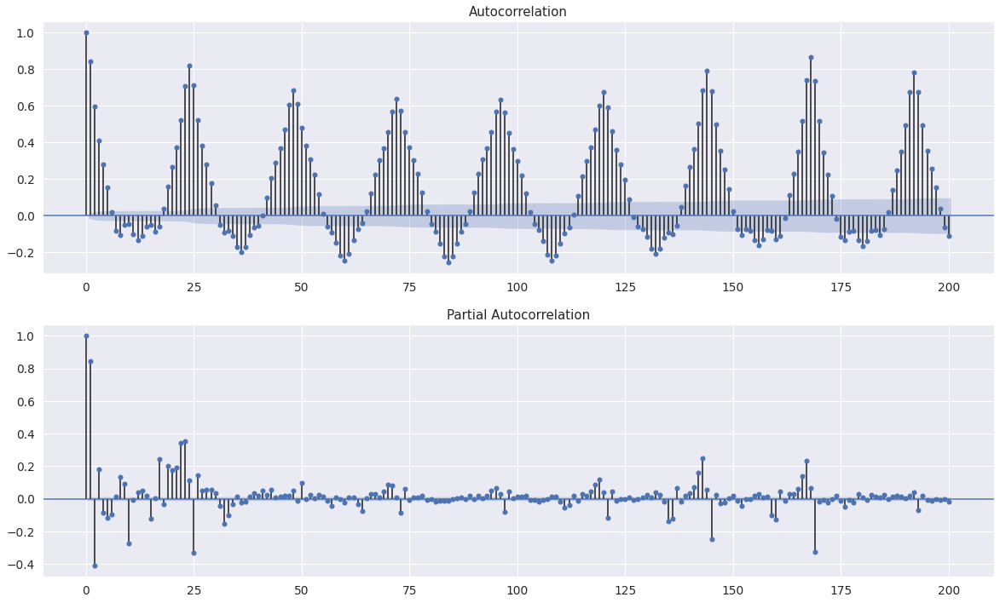

In [ ]:
fig = plt.figure(figsize=(20, 12))

ax1 = fig.add_subplot(211)
fig = plot_acf(df_arima['cnt'].values, lags=200, ax=ax1)

ax2 = fig.add_subplot(212)
fig = plot_pacf(df_arima['cnt'], lags=200, ax=ax2)

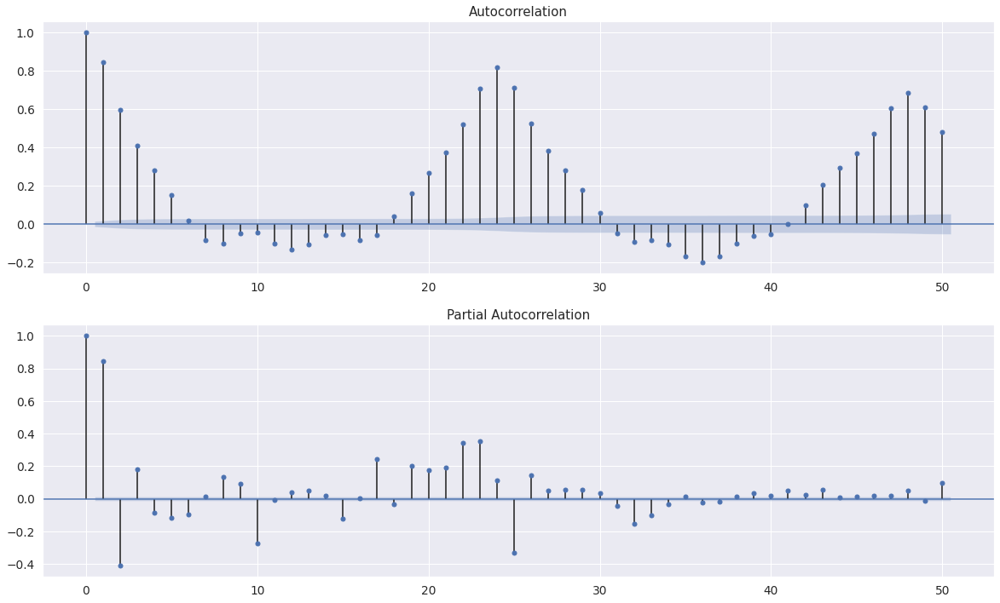

In [ ]:
fig = plt.figure(figsize=(20, 12))

ax1 = fig.add_subplot(211)
fig = plot_acf(df_arima['cnt'].values, lags=50, ax=ax1)

ax2 = fig.add_subplot(212)
fig = plot_pacf(df_arima['cnt'], lags=50, ax=ax2)

The figures show that autocorrelation function has a term corresponding to the day-periodic component with period 24 hours, which envelope corresponding to the week-periodic component with period 168 hours. This fact defines $q=169$ or at least $q=25$. The choice of a $q$-value less than 25 (but at least $q\geq2$) allows to catch some periodicity but with poor quality. Nevertheless, I start with $q=6$ and increase this value up to 25 to demonstrate the transformation of periodic shape which will reflects more complictaed details with increasing of $q$. I possibly will try to study the value $q=168$, but now I neglect this theoretically approved value for the sake of saving time, visibility, and simplicity.

The partial autocorrelation function also votes for mentioned above periodicities and it leads to the $p=168$ or at least $p=24$. And to make story short I omit the same explanation of the same reasons as for $p$-values and just say that I will study $q$ from 2 up to 25 to demonstrate how the shape of predicting changes.

Also, I introduce the function that allows me to train different ARIMA models and use them for predicting, to analyse the quality of model calculating MAE and plotting predictions and residual errors.

During the modelling we calculate Durbin-Watson statistics $DW$ to check if residuals are non-coorelated and can be treated as white noise (see [Wikipedia][https://en.wikipedia.org/wiki/Durbin%E2%80%93Watson_statistic] for details of the test). Here and now we should know that
* if there is no autocorrelation, $DW = 2$;
* for positive autocorrelation $DW\rightarrow 0$, and 
* for negative autocorrelation $DW\rightarrow 4$.

### ARIMA(6, 1, 2)

I start with the two ARIMA model (6, 1, 2) with different boolean parameters `dynamic` just tryimg to understand how this parameter works.

ARIMA model (6, 1, 2):
ar.L1        0.391929
ar.L2        0.402048
ar.L3       -0.325973
ar.L4        0.191760
ar.L5       -0.003146
ar.L6       -0.198861
ma.L1       -0.149572
ma.L2       -0.843375
sigma2    7017.692326
dtype: float64

Mean_absolute_error = 139.433



,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442
6,"ARIMA(6, 1, 2)_dynamic=True",139.433,23.9603


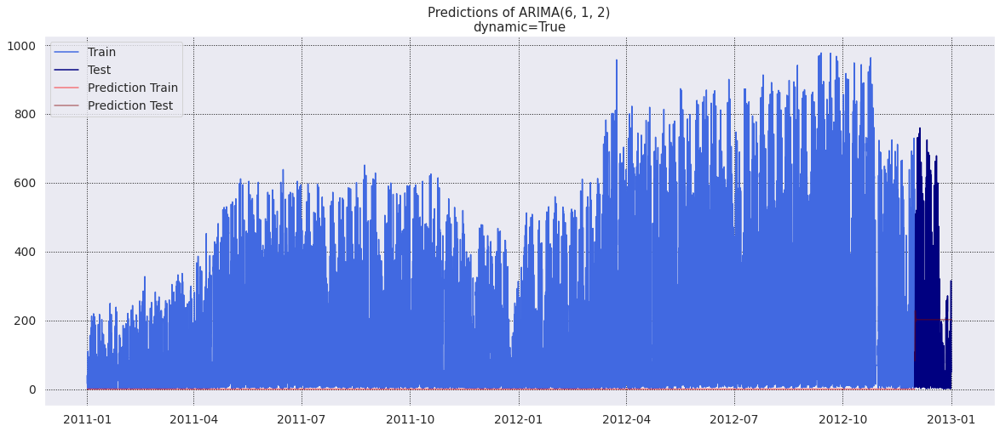

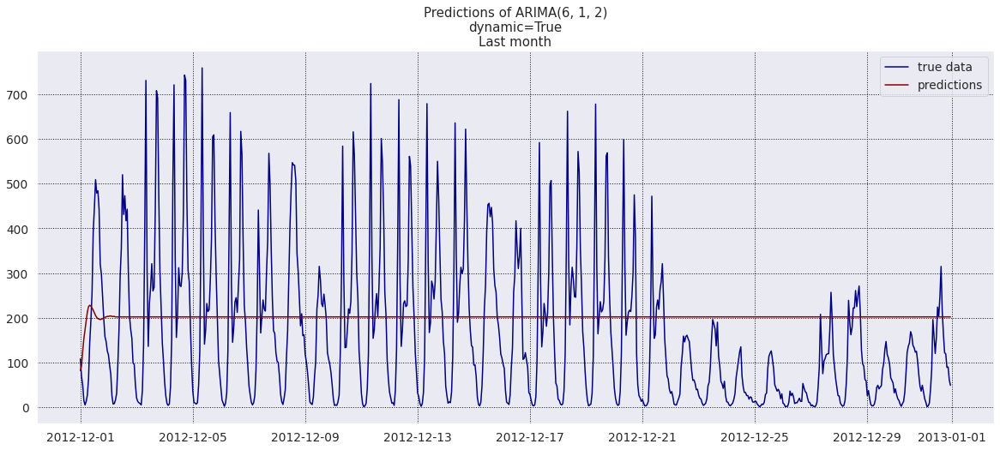


 Durbin-Watson statistics: DW = 2.036243721561655
We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

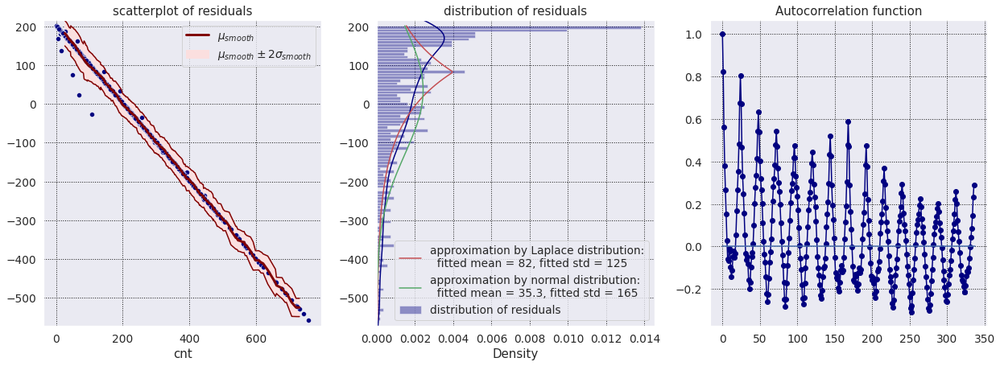

In [ ]:
arima_model_6_1_2 = arima_modelling(X_train, y_train, X_test, y_test, 
                                     p=6, d=1, q=2, dynamic=True)

ARIMA model (6, 1, 2):
ar.L1        0.391929
ar.L2        0.402048
ar.L3       -0.325973
ar.L4        0.191760
ar.L5       -0.003146
ar.L6       -0.198861
ma.L1       -0.149572
ma.L2       -0.843375
sigma2    7017.692326
dtype: float64

Mean_absolute_error = 139.433



,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442
6,"ARIMA(6, 1, 2)_dynamic=True",139.433,23.9603
7,"ARIMA(6, 1, 2)_dynamic=False",139.433,23.7922


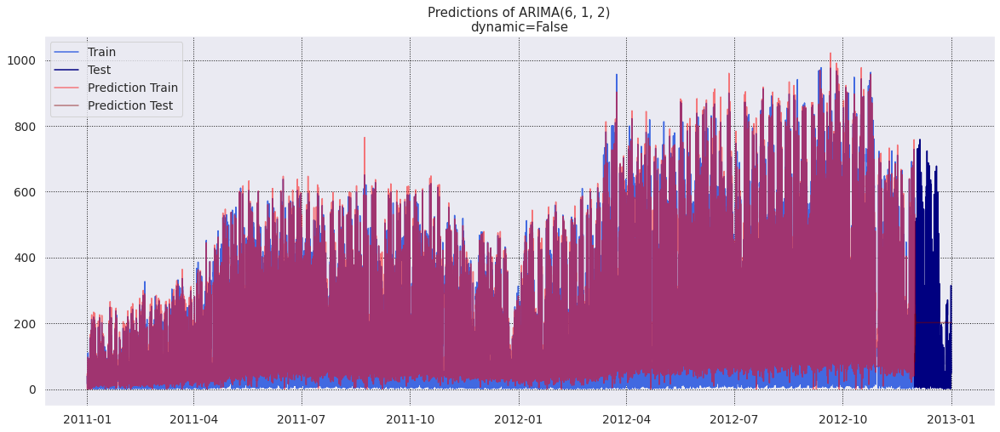

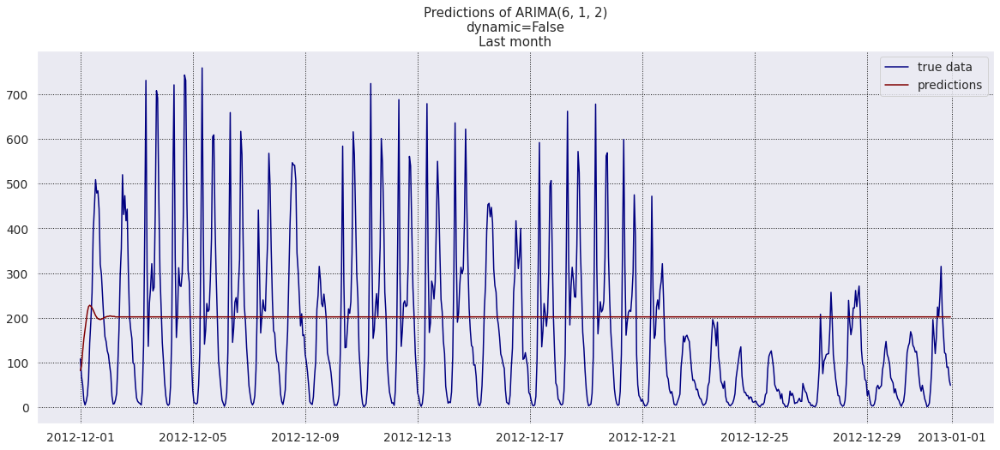


 Durbin-Watson statistics: DW = 2.036243721561655
We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

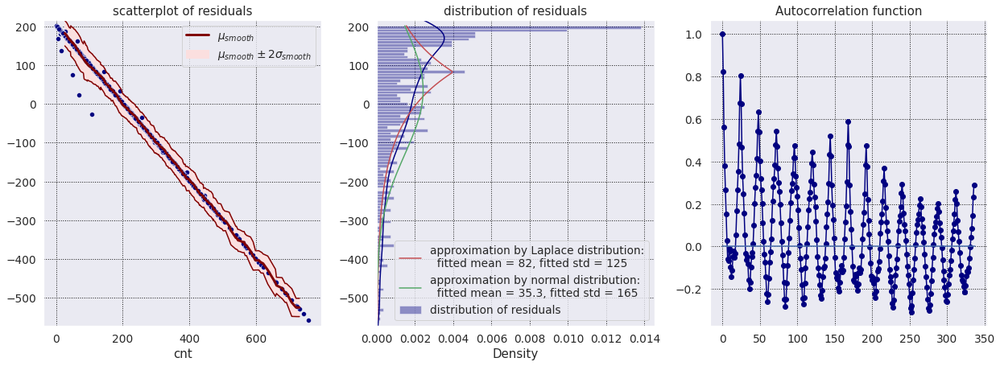

In [ ]:
arima_model_6_1_2 = arima_modelling(X_train, y_train, X_test, y_test, 
                                     p=6, d=1, q=2, dynamic=False)

1. It look like the change in `dynamic` parameter doesn't work. It should be studied later.

TODO
- [ ] Study the `dynamic` parameter of ARIMA model.

2. The model still has strong bias. The scatter plot of residual errors shows almost linear dependence
$$
y_{pred} - y_{true} \approx C_1 y_{true} + C_0
$$

In [ ]:
p, d, q = 6, 1, 2

y_true = df_arima_test['cnt']
y_pred = df_arima_test[f'prediction_arima_{p}_{d}_{q}']

lin_reg_res = LinearRegression()
lin_reg_res.fit(y_true.values.reshape(-1, 1), y_pred - y_true)
print(f"C_1 = {lin_reg_res.coef_[0]:.3g}")
print(f"C_0 = {lin_reg_res.intercept_:.3g}")

C_1 = -0.998
C_0 = 201


Since we get $C_1\approx1$ we can drop $y_true$ and finally obtain that
$$
y_{pred} \approx C_0\,,
$$
i.e., our predictions are almost constant. And indeed, that is the fact that one can see in figure of predictions as a function of time. The slight difference between $C_1$ and unity just remind us about short oscillation with low amplitude in the very beginning of the time prediction range.

*To summarize our results:* 

Our predictions is almost constant with short rapidly decaying oscillation with low amplitude in the very beginning of the time prediction range. This oscillation fails even to catch a proper phase. The model has strong bias, residual errors are not white noise.

### ARIMA(6, 1, 4)

Let us increase $q$ and study what it changes.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:965: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:977: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA model (6, 1, 4):
ar.L1        0.248134
ar.L2        1.246132
ar.L3       -0.508126
ar.L4       -0.273836
ar.L5        0.322612
ar.L6       -0.324604
ma.L1       -0.010599
ma.L2       -1.731995
ma.L3       -0.078632
ma.L4        0.857849
sigma2    7340.617529
dtype: float64

Mean_absolute_error = 153.133



,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442
6,"ARIMA(6, 1, 2)_dynamic=True",139.433,23.9603
7,"ARIMA(6, 1, 2)_dynamic=False",139.433,23.7922
8,"ARIMA(6, 1, 4)_dynamic=True",153.133,28.7956


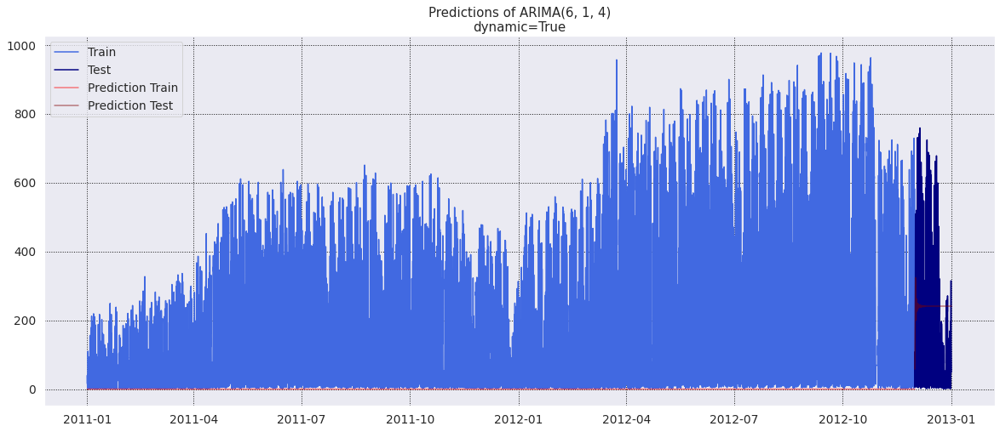

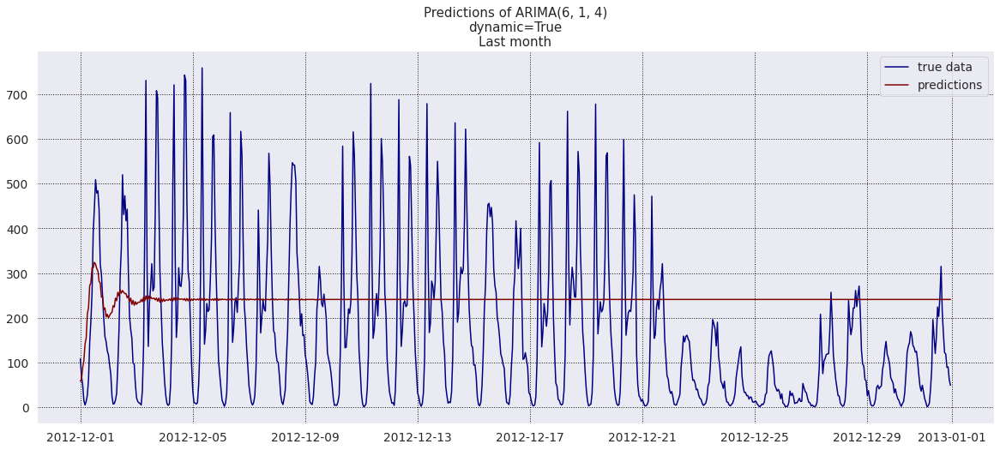


 Durbin-Watson statistics: DW = 2.0324759852990613
We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

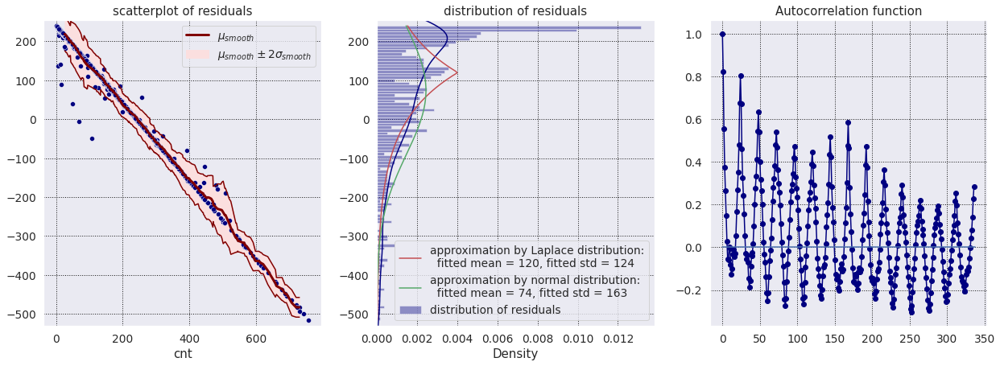

In [ ]:
arima_model_6_1_4 = arima_modelling(X_train, y_train, X_test, y_test, 
                                     p=6, d=1, q=4)

In [ ]:
p, d, q = 6, 1, 4

y_true = df_arima_test['cnt']
y_pred = df_arima_test[f'prediction_arima_{p}_{d}_{q}']

lin_reg_res = LinearRegression()
lin_reg_res.fit(y_true.values.reshape(-1, 1), y_pred - y_true)
print(f"C_1 = {lin_reg_res.coef_[0]:.3g}")
print(f"C_0 = {lin_reg_res.intercept_:.3g}")

C_1 = -0.986
C_0 = 238


* This model almost still predicts almost constant but with another constant. And it looks like that this change in constant leads to the decreasing the quality of model performance (MAE increased).
* Increasing in $q$ decrease the decaying rate of oscillations (here we clearly observe two full periods) and allows model to catch a proper phase. 
* The model has strong bias, residual errors are not white noise.

### ARIMA(8, 1, 4)

And now let us study how increasing of $p$ changes predictiions provided by ARIMA model and its performance.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:965: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:977: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA model (8, 1, 4):
ar.L1        0.088671
ar.L2       -0.345785
ar.L3        0.135793
ar.L4        0.419160
ar.L5       -0.215026
ar.L6        0.044568
ar.L7       -0.111974
ar.L8       -0.282875
ma.L1        0.141470
ma.L2        0.021564
ma.L3       -0.384045
ma.L4       -0.760924
sigma2    7001.033391
dtype: float64

Mean_absolute_error = 138.808



,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442
6,"ARIMA(6, 1, 2)_dynamic=True",139.433,23.9603
7,"ARIMA(6, 1, 2)_dynamic=False",139.433,23.7922
8,"ARIMA(6, 1, 4)_dynamic=True",153.133,28.7956
9,"ARIMA(8, 1, 4)_dynamic=True",138.808,38.5956


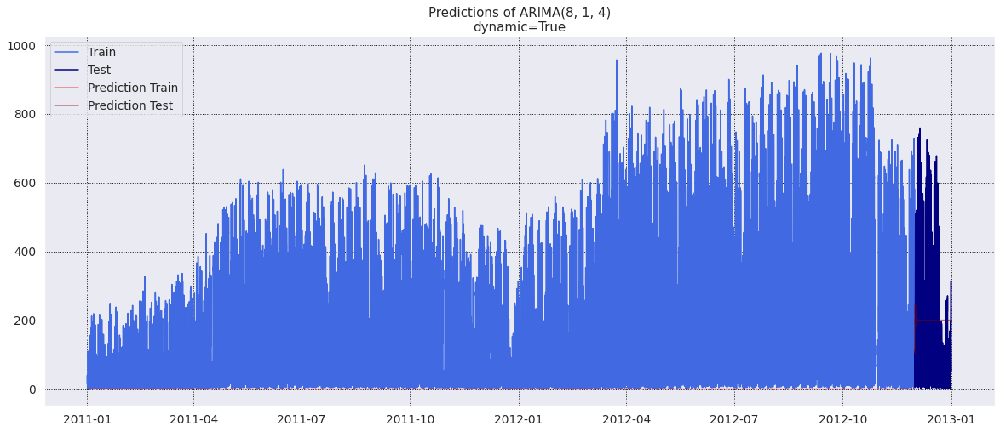

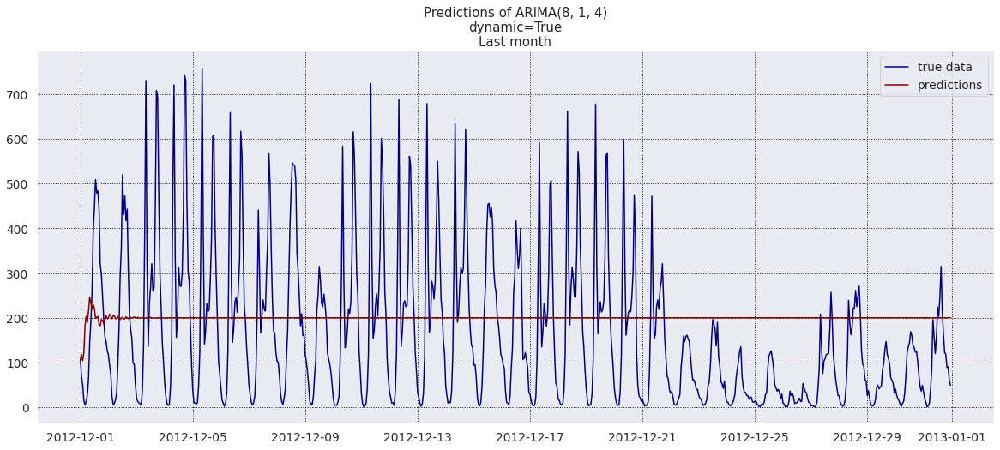


 Durbin-Watson statistics: DW = 1.9962751738974112
We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

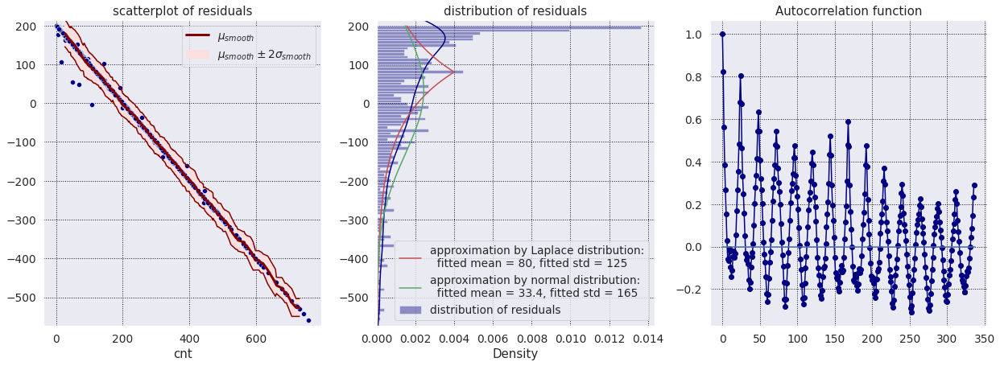

In [ ]:
arima_model_8_1_4 = arima_modelling(X_train, y_train, X_test, y_test, 
                                     p=8, d=1, q=4)

In [ ]:
p, d, q = 8, 1, 4

y_true = df_arima_test['cnt']
y_pred = df_arima_test[f'prediction_arima_{p}_{d}_{q}']

lin_reg_res = LinearRegression()
lin_reg_res.fit(y_true.values.reshape(-1, 1), y_pred - y_true)
print(f"C_1 = {lin_reg_res.coef_[0]:.3g}")
print(f"C_0 = {lin_reg_res.intercept_:.3g}")

C_1 = -0.998
C_0 = 199


The introduction of two additional autocorrelation terms allows model
* to provide predictions with more complicated shape of oscillations
* to shift the constant to more proper value (at least MAE decreased)
Along with this
* the rate of decay doesn't change
* model still has strong bias
* residual errors are not white noise

### ARIMA(8, 1, 25)

At this stage we keep $p$ but increase the $q$ significantly.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:977: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA model (8, 1, 25):
ar.L1       -0.520969
ar.L2       -0.156171
ar.L3       -0.397748
ar.L4       -0.106227
ar.L5       -0.157510
ar.L6       -0.174658
ar.L7       -0.334170
ar.L8       -0.483766
ma.L1        0.675053
ma.L2       -0.051664
ma.L3        0.026720
ma.L4       -0.126920
ma.L5       -0.143281
ma.L6       -0.145694
ma.L7       -0.009709
ma.L8        0.019623
ma.L9       -0.232883
ma.L10      -0.180352
ma.L11      -0.252263
ma.L12      -0.218649
ma.L13      -0.255198
ma.L14      -0.232649
ma.L15      -0.128591
ma.L16      -0.196010
ma.L17      -0.074746
ma.L18      -0.052577
ma.L19      -0.167211
ma.L20      -0.135694
ma.L21      -0.087344
ma.L22      -0.023238
ma.L23       0.082873
ma.L24       0.525393
ma.L25       0.421912
sigma2    5423.854008
dtype: float64

Mean_absolute_error = 136.957



,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442
6,"ARIMA(6, 1, 2)_dynamic=True",139.433,23.9603
7,"ARIMA(6, 1, 2)_dynamic=False",139.433,23.7922
8,"ARIMA(6, 1, 4)_dynamic=True",153.133,28.7956
9,"ARIMA(8, 1, 4)_dynamic=True",138.808,38.5956


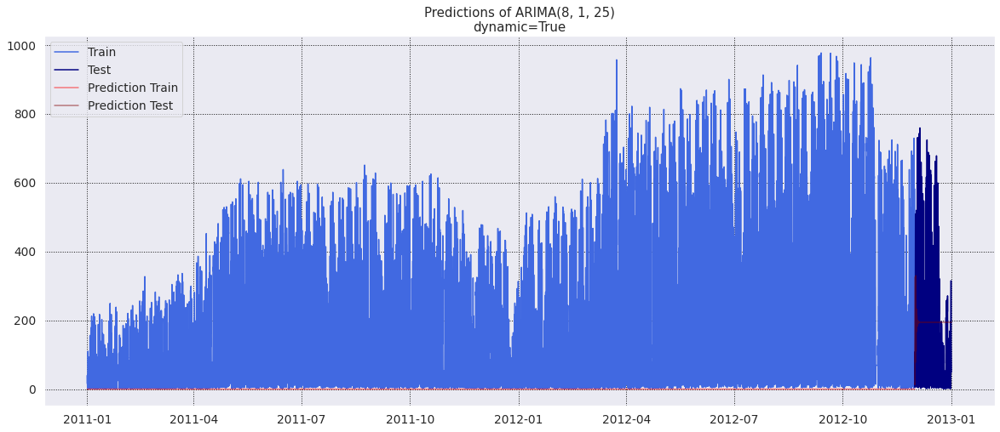

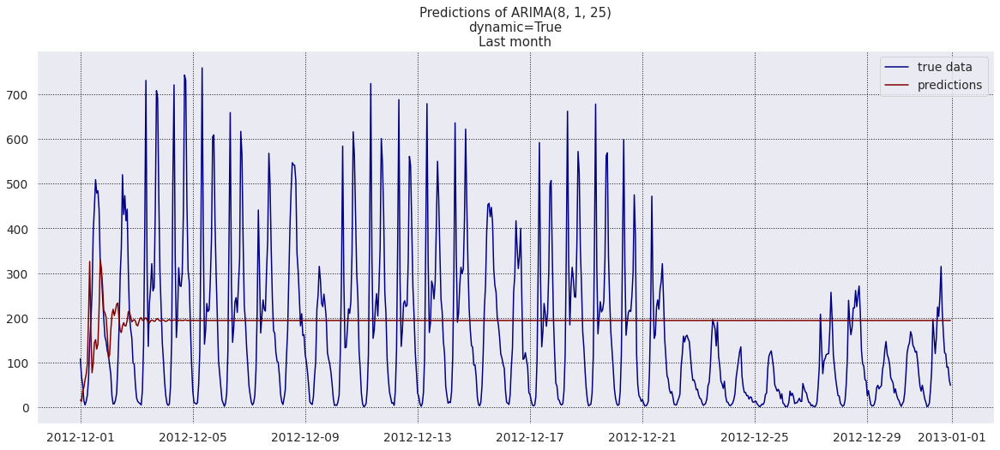


 Durbin-Watson statistics: DW = 1.9784394565506003
We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

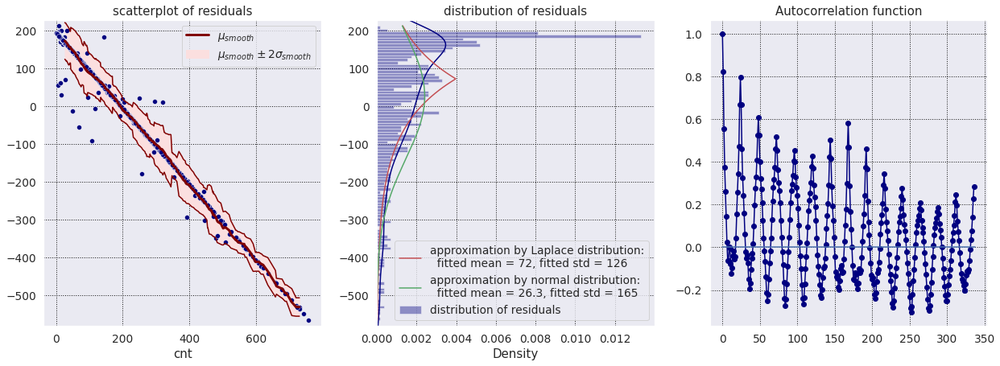

In [ ]:
arima_model_8_1_25 = arima_modelling(X_train, y_train, X_test, y_test, 
                                     p=8, d=1, q=25)

As one can see $DW\approx2$, and we haven't autocorrelation for residuals, i.e., residuals can be treated as a white noise.

And now let us check whether residuals govern by the normal distribution.

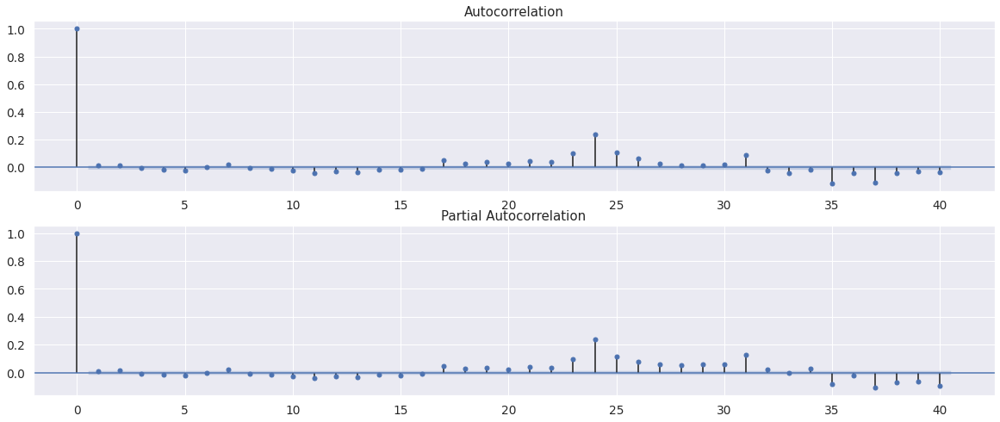

In [ ]:
# plot right autocorrelation function for residual errors

fig = plt.figure(figsize=(20, 8))

ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(arima_model_8_1_25.resid, lags=40, ax=ax1)

ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(arima_model_8_1_25.resid, lags=200, ax=ax2)

ARIMA(24, 1, 25)

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


ARIMA model (24, 1, 25):
ar.L1       -0.053341
ar.L2       -0.163623
ar.L3       -0.099410
ar.L4       -0.064845
ar.L5       -0.138144
ar.L6       -0.068571
ar.L7       -0.079370
ar.L8       -0.151144
ar.L9       -0.041791
ar.L10      -0.197392
ar.L11      -0.120459
ar.L12      -0.116844
ar.L13      -0.184476
ar.L14      -0.102891
ar.L15      -0.096055
ar.L16      -0.149207
ar.L17      -0.032289
ar.L18      -0.172979
ar.L19      -0.072829
ar.L20      -0.059789
ar.L21      -0.147153
ar.L22      -0.059991
ar.L23      -0.125902
ar.L24       0.698480
ma.L1        0.072973
ma.L2       -0.240567
ma.L3       -0.230947
ma.L4       -0.175009
ma.L5       -0.069039
ma.L6       -0.097219
ma.L7       -0.134611
ma.L8       -0.093083
ma.L9        0.140677
ma.L10       0.346046
ma.L11       0.110098
ma.L12      -0.013794
ma.L13       0.014884
ma.L14       0.025692
ma.L15      -0.025213
ma.L16      -0.124168
ma.L17      -0.199383
ma.L18      -0.000778
ma.L19      -0.053620
ma.L20      -0.066520
ma.L21 

,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442
6,"ARIMA(6, 1, 2)_dynamic=True",139.433,23.9603
7,"ARIMA(6, 1, 2)_dynamic=False",139.433,23.7922
8,"ARIMA(6, 1, 4)_dynamic=True",153.133,28.7956
9,"ARIMA(8, 1, 4)_dynamic=True",138.808,38.5956


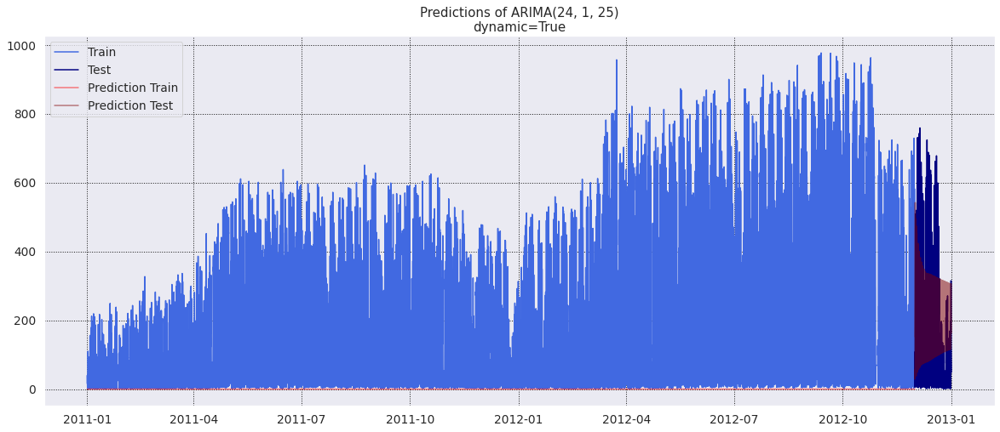

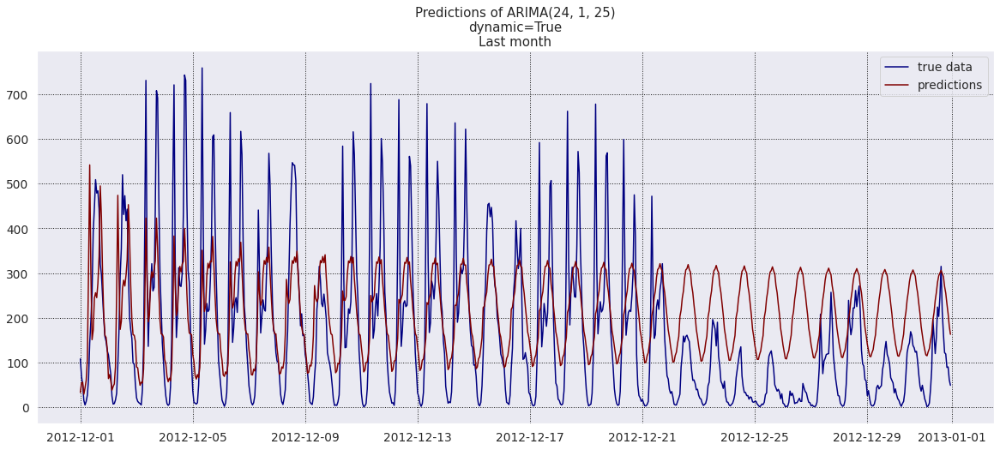


 Durbin-Watson statistics: DW = 1.9717482465036325
We have 744 points.


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1647: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:666: FutureWar

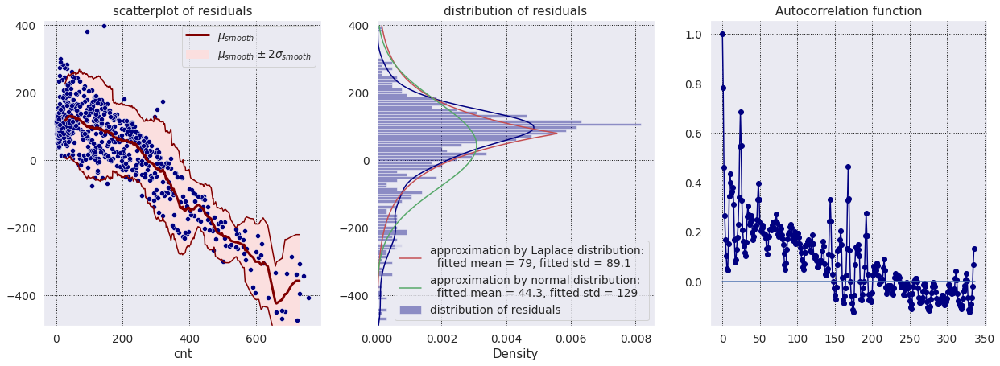

In [ ]:
arima_model_24_1_25 = arima_modelling(X_train, y_train, X_test, y_test, 
                                      p=24, d=1, q=25)

In [ ]:
ind_start = df_arima_test.index.max() - pd.Timedelta(days=TEST_DAYS) + pd.Timedelta(1, 'H')
time_marks = df_arima_test.index[df_arima_test.index >= ind_start][::24]

time_marks_df = pd.DataFrame(time_marks, columns=['date'])
time_marks_df['day_of_week'] = time_marks_df['date'].dt.day_name()
time_marks_df['date_day'] = time_marks_df['date'].astype(str) + " ("  + time_marks_df['day_of_week'].astype(str).apply(lambda x: x[:3]) + ")"
time_marks_df

,date,day_of_week,date_day
0,2012-12-01,Saturday,2012-12-01 (Sat)
1,2012-12-02,Sunday,2012-12-02 (Sun)
2,2012-12-03,Monday,2012-12-03 (Mon)
3,2012-12-04,Tuesday,2012-12-04 (Tue)
4,2012-12-05,Wednesday,2012-12-05 (Wed)
5,2012-12-06,Thursday,2012-12-06 (Thu)
6,2012-12-07,Friday,2012-12-07 (Fri)
7,2012-12-08,Saturday,2012-12-08 (Sat)
8,2012-12-09,Sunday,2012-12-09 (Sun)
9,2012-12-10,Monday,2012-12-10 (Mon)


data for first 168 hours (1 weeks 0 days 0 hours) since 2012-12-01.


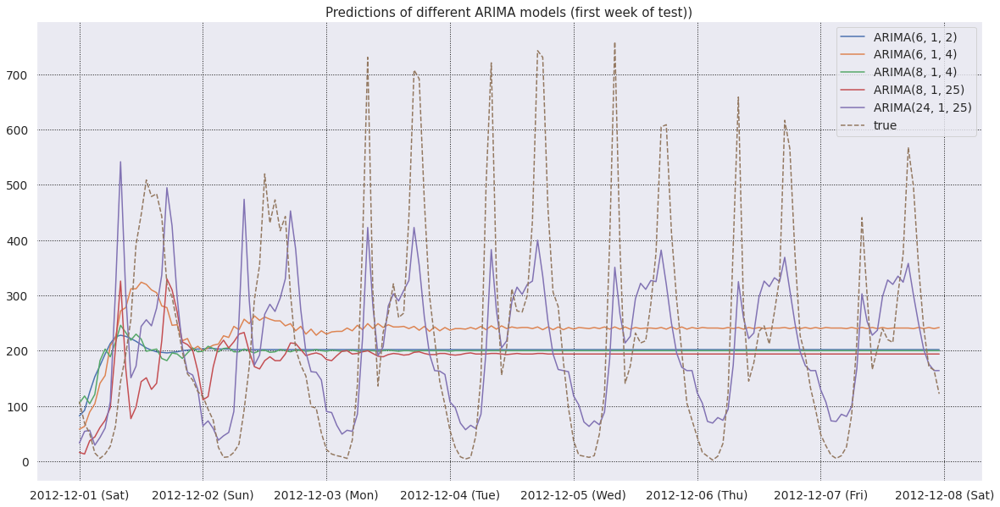

In [ ]:
n_days = 7
n_max = n_days*24

print(f"data for first {n_max} hours ({n_max//(7*24)} weeks {(n_max - (n_max//(7*24))*7*24)//24} days {(n_max - (n_max//24)*24)} hours) " \
      +f"since {(df0.index.max() - pd.Timedelta(days=TEST_DAYS) + pd.Timedelta(1, 'H')).date()}.")


ind_start = df_arima_test.index.max() - pd.Timedelta(days=TEST_DAYS) + pd.Timedelta(1, 'H')
time_marks = df_arima_test.index[df_arima_test.index >= ind_start][:n_max+24:24]


plt.subplots(1, 1, figsize=(20, 10))
for coeffs in [(6, 1, 2), (6, 1, 4), (8, 1, 4), (8, 1, 25), (24, 1, 25)]:
    p, d, q = coeffs
    plt.plot(df_arima_test[f'prediction_arima_{p}_{d}_{q}'].values[:n_max], 
             label=f"ARIMA({p}, {d}, {q})")
   
plt.plot(df_arima_test['cnt'].values[:n_max], '--', label="true")
plt.xticks(np.arange(0, n_max+24, 24), 
           time_marks_df['date_day'].values[:n_days+1], 
           rotation=0)
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title("Predictions of different ARIMA models (first week of test))")
plt.show()

data for first 744 hours (4 weeks 3 days 0 hours) since 2012-12-01.


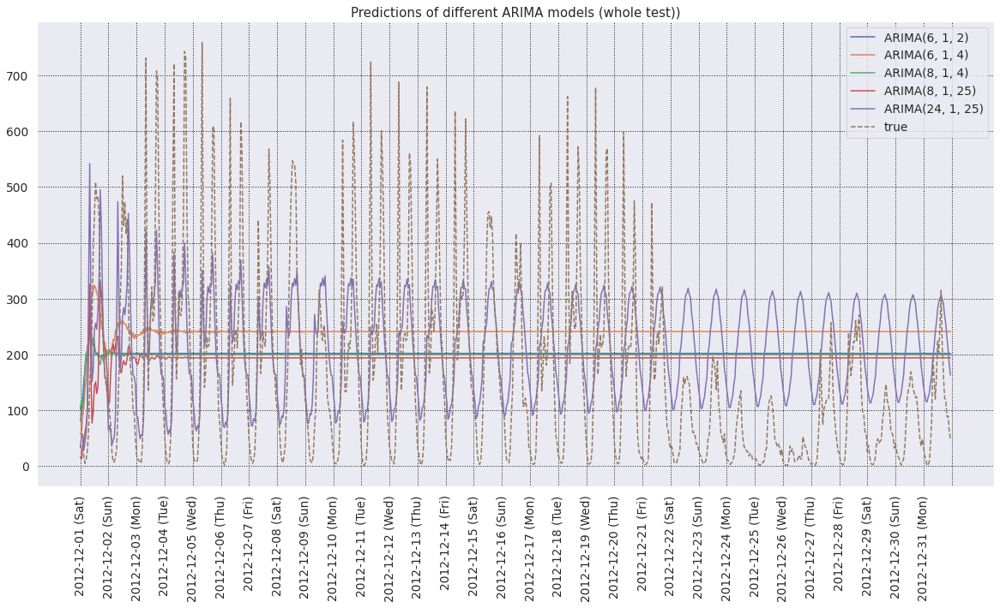

In [ ]:
n_days = 31
n_max = n_days*24

print(f"data for first {n_max} hours ({n_max//(7*24)} weeks {(n_max - (n_max//(7*24))*7*24)//24} days {(n_max - (n_max//24)*24)} hours) " \
      +f"since {(df0.index.max() - pd.Timedelta(days=TEST_DAYS) + pd.Timedelta(1, 'H')).date()}.")


ind_start = df_arima_test.index.max() - pd.Timedelta(days=TEST_DAYS) + pd.Timedelta(1, 'H')
time_marks = df_arima_test.index[df_arima_test.index >= ind_start][:n_max+24:24]


plt.subplots(1, 1, figsize=(20, 10))
for coeffs in [(6, 1, 2), (6, 1, 4), (8, 1, 4), (8, 1, 25), (24, 1, 25)]:
    p, d, q = coeffs
    plt.plot(df_arima_test[f'prediction_arima_{p}_{d}_{q}'].values[:n_max], 
             label=f"ARIMA({p}, {d}, {q})")
   
plt.plot(df_arima_test['cnt'].values[:n_max], '--', label="true")
plt.xticks(np.arange(0, n_max+24, 24), 
           time_marks_df['date_day'].values[:n_days+1], 
           rotation=90)
plt.legend()
plt.grid(linestyle=':', color='k')
plt.title("Predictions of different ARIMA models (whole test))")
plt.show()

In [ ]:
results_df

,Model,MAE,train_time_sec
0,LinReg_simplest,177.876,0.0892158
1,LinReg_fourier_hour,152.162,0.385348
2,LinReg_fourier_week,151.941,0.510941
3,* LinReg_dynamic(trend_only),0.118205,0.150279
4,* LinReg_dynamic(trend_only),55.9234,0.170193
5,LinReg_season_exog,72.6949,0.169442
6,"ARIMA(6, 1, 2)_dynamic=True",139.433,23.9603
7,"ARIMA(6, 1, 2)_dynamic=False",139.433,23.7922
8,"ARIMA(6, 1, 4)_dynamic=True",153.133,28.7956
9,"ARIMA(8, 1, 4)_dynamic=True",138.808,38.5956


In [ ]:
time_work_finish = time.time()
time_work = time_work_finish - time_work_start
print(f"Notebook started  run at {time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(time_work_start))} UTC.")
print(f"Notebook finished run at {time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(time_work_finish))} UTC.")
# print(f"Notebook worked for {time_work} sec.")
print(f"Notebook worked for {int(time_work//3600)} hr {int((time_work - (time_work//3600)*3600)//60)} min {int((time_work - (time_work//60)*60))} sec.")